# CLASP – CLassification of Abnormal Seizure Patterns  # Biomedical Signal Processing


## Introduction

The challenge is to build a machine learning model that can classify different types of seizures from **EEG signals**. The aim is to create a model that not only identifies seizure types but also provides **explainable insights** to help clinicians understand and trust the model's decisions.

### Dataset Overview:
The dataset consists of EEG signals categorized into four classes:
1. **Normal**
2. **Complex Partial Seizures**
3. **Electrographic Seizures**
4. **Video Detected Seizures with No Visual Change Over EEG**

### Objectives:
The challenge is to preprocess, analyze, and build a robust machine learning model for classifying these EEG signals. A key focus is on **model explainability** to assist healthcare professionals in interpreting the results.

### Repository Highlights:
This repository covers several aspects of the project:

#### 1. **Preprocessing and Feature Extraction**
   - **Goal**: Analyze EEG signals using time-domain and frequency-domain techniques.
   - **Methods**: Extract meaningful features, including statistical metrics and Fourier Transforms.

#### 2. **Model Building**
   - **Goal**: Develop a baseline machine learning model and improve it.
   - **Methods**: Experiment with different techniques and models for better classification accuracy.

#### 3. **Explainability**
   - **Goal**: Ensure transparency and trust in the model’s decisions.
   - **Methods**: Use tools like **SHAP** to understand model predictions and make the process interpretable for clinicians.

#### 4. **Denoising**
   - **Goal**: Handle noisy EEG data.
   - **Methods**: Apply signal denoising methods to improve model performance.

#### 5. **Generative Modeling**
   - **Goal**: Augment the training set with synthetic EEG data.
   - **Methods**: Use generative algorithms to enhance model training and boost performance.

### Our Aim:
The ultimate goal is not only to achieve high classification accuracy but also to create a model that is **interpretable**, **efficient**, and **practical for real-world healthcare applications**.

### Repository Structure:
The repository is designed to ensure **reproducibility** and **clarity**. It includes detailed explanations, code, insights, and visualizations to make the process transparent and easy to follow.

In the following sections, you'll find a breakdown of the approach taken for each task, along with the code, insights, and results that contributed to the best possible outcome for this challenge.


### EEG Data Analysis Libraries 

This code snippet uses several libraries to process, analyze, and model EEG data. Below is an overview of each library and its typical use case.

#### Libraries Used

##### 1. **`os`**
   - **Purpose**: Interact with the operating system (file handling, path manipulations).
   - **Use Case**: Manage EEG data files, directories, and environment paths.

##### 2. **`numpy`**
   - **Purpose**: Perform numerical operations on arrays and matrices.
   - **Use Case**: Handle and manipulate EEG data in array format, performing mathematical operations.

##### 3. **`matplotlib.pyplot`**
   - **Purpose**: Create static, animated, and interactive visualizations.
   - **Use Case**: Visualize EEG data, plot time-series, and show analysis results.

##### 4. **`pandas`**
   - **Purpose**: Handle and manipulate structured data (e.g., DataFrames).
   - **Use Case**: Organize, clean, and manipulate EEG data for analysis.

##### 5. **`pywt`**
   - **Purpose**: Apply wavelet transforms for signal processing.
   - **Use Case**: Analyze EEG signals in the time-frequency domain.

##### 6. **`torch.utils.data.Dataset` & `DataLoader`**
   - **Purpose**: Manage datasets and load them in batches for neural networks.
   - **Use Case**: Prepare EEG data for deep learning models, loading efficiently in batches.

##### 7. **`scipy.interpolate`**
   - **Purpose**: Interpolate data points (e.g., filling missing values or resampling).
   - **Use Case**: Resample or interpolate EEG data to ensure consistent time points.

##### 8. **`scipy.signal.spectrogram`**
   - **Purpose**: Compute the spectrogram (time-frequency representation) of a signal.
   - **Use Case**: Analyze the frequency content of EEG signals over time.

##### 9. **`sklearn.decomposition.FastICA`**
   - **Purpose**: Perform Independent Component Analysis (ICA).
   - **Use Case**: Separate mixed EEG signals into independent sources (e.g., brain activity sources).

##### 10. **`sklearn.model_selection.train_test_split`**
   - **Purpose**: Split datasets into training and testing subsets.
   - **Use Case**: Divide EEG data into training and test sets for model evaluation.

##### 11. **`tensorflow.keras.models.Sequential`**
   - **Purpose**: Define a neural network model layer by layer.
   - **Use Case**: Build and train neural networks for EEG signal classification or regression.

##### 12. **`tensorflow.keras.layers.Dense`, `Dropout`, `Input`**
   - **Purpose**: Define layers in a neural network model.
     - **`Dense`**: Fully connected layer.
     - **`Dropout`**: Regularization to prevent overfitting.
     - **`Input`**: Input layer for defining model input.
   - **Use Case**: Build and regularize neural networks for EEG data analysis.

##### 13. **`tensorflow.keras.optimizers.Adam`**
   - **Purpose**: Adaptive learning rate optimizer for training deep learning models.
   - **Use Case**: Optimize the training process for EEG classification or prediction models.

---

#### Summary

This collection of libraries is designed for **EEG data analysis**, including:

- **Signal processing** (wavelet transforms, spectrogram analysis)
- **Feature extraction** (Independent Component Analysis)
- **Model training** (building and training neural networks)
- **Data handling and manipulation** (using Pandas, NumPy, and SciPy)

These tools are powerful for **EEG signal classification**, **brain activity prediction**, and **time-frequency analysis**.


In [84]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pywt

import torch
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import Dataset
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim

from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, roc_auc_score, balanced_accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.decomposition import FastICA
from skimage.metrics import structural_similarity as ssim
from sklearn.utils.class_weight import compute_class_weight

import seaborn as sns

from scipy import interpolate
from scipy.signal import spectrogram
from scipy.signal import resample

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam

import shap
from collections import defaultdict

import time

### Loading EEG Data

This section explains how the EEG data is loaded and organized for analysis. The data is stored in separate directories, each representing a different type of EEG signal:

- **Normal data**: Represents regular brain activity.
- **Complex Partial Seizures**: Data from partial seizures.
- **Electrographic Seizures**: Data from electrographic seizures.
- **Video-detected Seizures with no Visual Change Over EEG**: Data from seizures detected by video without visible changes in the EEG.
- **Noisy Normal data**: Normal EEG data with added noise.

Each file contains a 19x500 matrix (19 EEG channels, 500 samples per second). The **NPYDataset** class is used to load the data from these directories into separate datasets, making it easy to access for analysis and model training.

In summary:
- Each dataset corresponds to a specific seizure type or normal data.
- The data is ready for use in machine learning models.


### - NPYDataset Class

A custom PyTorch dataset to load EEG data from `.npy` files. It initializes by reading all `.npy` files in the given directory and sorts them. The `__len__` method returns the total number of files. The `__getitem__` method loads and returns data along with the label (extracted from the filename). This class enables easy data handling for deep learning tasks.


In [85]:
class NPYDataset(Dataset):
    """
    Custom PyTorch Dataset to load data from multiple .npy files.
    """
    def __init__(self, directory):
        """
        Args:
            directory (str): Path to the directory containing .npy files.
        """
        self.directory = directory
        self.file_paths = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith('.npy')]
        self.file_paths.sort()  # Ensure consistent ordering

    def __len__(self):
        """Return the total number of .npy files."""
        return len(self.file_paths)

    def __getitem__(self, idx):
        """
        Load and return a single .npy file's data and its label (if applicable).
        Args:
            idx (int): Index of the file to load.
        
        Returns:
            np.ndarray: Data from the .npy file.
        """
        file_path = self.file_paths[idx]
        data = np.load(file_path)
        label = os.path.basename(file_path).split('.')[0]  # Example: Use the file name as a label
        return data, label

In [86]:
# Define the directory containing the .npy files
normal_data_directory = "/kaggle/input/impulse/Impulse/EEG_Data/train_data/Normal"  
cps_data_directory = "/kaggle/input/impulse/Impulse/EEG_Data/train_data/Complex_Partial_Seizures"
video_data_directory = "/kaggle/input/impulse/Impulse/EEG_Data/train_data/Video_detected_Seizures_with_no_visual_change_over_EEG"
seizure_data_directory = "/kaggle/input/impulse/Impulse/EEG_Data/train_data/Electrographic_Seizures"
normal_withnoise_directory = "/kaggle/input/impulse/Impulse/EEG_Data/noisy_train_data/Normal"
# Create the dataset and dataloader
normaldataset = NPYDataset(normal_data_directory)
cpsdataset = NPYDataset(cps_data_directory)
videodataset = NPYDataset(video_data_directory)
seizuredataset = NPYDataset(seizure_data_directory)
normalnoisedataset = NPYDataset(normal_withnoise_directory)

### - DataLoader and Data Extraction

This code snippet loads EEG data using `DataLoader` for each dataset (normal, complex partial seizures, video-detected seizures, and electrographic seizures). It iterates over the dataset, extracts one batch at a time, and converts the data into a numpy array. For the noisy dataset, a specific sample is directly loaded and converted to an array.


In [87]:
dataloader = DataLoader(normaldataset, batch_size=1, shuffle=True)
normaleg, _ = next(iter(dataloader))
normal_data = np.array(normaleg).squeeze()

dataloader = DataLoader(cpsdataset, batch_size=1, shuffle=True)
cpseg, _ = next(iter(dataloader))
cps_data = np.array(cpseg).squeeze()

dataloader = DataLoader(videodataset, batch_size=1, shuffle=True)
videoeg, _ = next(iter(dataloader))
video_data = np.array(videoeg).squeeze()

dataloader = DataLoader(seizuredataset, batch_size=1, shuffle=True)
seizureeg, _ = next(iter(dataloader))
seizure_data = np.array(seizureeg).squeeze()

noiseg,_ = normalnoisedataset[8]
noise_data = np.array(noiseg)


## Task 4: Basic Analysis of EEG Signals

In this task, we’ll explore the EEG signals by visualizing them and calculating some basic statistical metrics. This will help us understand the characteristics of the signals and provide useful insights for further analysis.

### Task 4.1: Steps
1. **Data Selection**: We will select one data point from each of the four classes: Normal, Complex Partial Seizures, Electrographic Seizures, and Video Detected Seizures with no visual change over EEG.

2. **Plotting EEG Signals**:
   - For each selected data point, we’ll plot the EEG signal for all 19 channels separately. This helps us see how the signal behaves across different channels.
   - We’ll also create a combined plot with all 19 channels superimposed to get a broader view of the signal's behavior.

   This gives us a total of **20 plots** per data point: 19 individual channel plots and 1 combined plot.

3. **Computing Basic Statistical Metrics**:
   For each of the 19 channels, we’ll calculate the following time-domain metrics:
   - **Mean**: Average value of the signal over time.
   - **Zero Crossing Rate**: The frequency at which the signal crosses zero.
   - **Range**: Difference between the highest and lowest values of the signal.
   - **Energy**: The total energy of the signal, indicating its intensity.
   - **RMS**: Root Mean Square, a measure of the signal’s magnitude.
   - **Variance**: How spread out the signal values are.

These visualizations and metrics will help us better understand the EEG data and prepare for more advanced analysis in future tasks.


### Plotting EEG for all 19 channels + 1 superimposed channel :

In [88]:
# Function to plot EEG signals
def info(loaded_data):
    # Create a figure with subplots
    fig, axes = plt.subplots(nrows=20, ncols=1, figsize=(12, 24), gridspec_kw={"height_ratios": [1] + [0.5]*19})
           
    
    # Plot each channel in its own subplot
    for i in range(19):
        axes[0].plot(loaded_data[i], label=f"Channel {i+1}")
        axes[0].legend(loc="upper right", fontsize=8, ncol=3)
        axes[0].set_ylabel("Amplitude")
        axes[0].grid(True)
        
        axes[i+1].plot(loaded_data[i], label=f"Channel {i+1}")
        axes[i+1].legend(loc="upper right", fontsize=8)
        axes[i+1].set_ylabel(f"Ch {i+1}")
        axes[i+1].grid(True)
        
        # Make x-ticks and y-ticks more readable
        axes[i+1].tick_params(axis='x', labelsize=10)  # Set x-tick label font size
        axes[i+1].tick_params(axis='y', labelsize=10)  # Set y-tick label font size (if y-ticks exist)
    
    # Improve the x-axis ticks for all subplots
    axes[0].tick_params(axis='x', labelsize=10)  # Top subplot x-ticks
    
    # Add a common x-axis label
    plt.xlabel("Samples", fontsize=12)
    
    # Adjust layout for better spacing
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for the title
    plt.show()
    
    metrics_list = calculateparams(loaded_data)
    # Create a Pandas DataFrame from the metrics list
    return pd.DataFrame(metrics_list)

In [89]:
# Function to Computing Basic Statistical Metrics:
def calculateparams(loaded_data):
    metrics_list = []
    
    # Compute metrics for each channel
    for i in range(loaded_data.shape[0]):
        channel_data = loaded_data[i]
        
        # Compute metrics
        mean = np.mean(channel_data)
        zero_crossings = np.sum(np.diff(np.sign(channel_data)) != 0)
        value_range = np.ptp(channel_data)  # Peak-to-peak range
        energy = np.sum(channel_data**2)
        rms = np.sqrt(np.mean(channel_data**2))
        variance = np.var(channel_data)
        
        # Append metrics as a dictionary
        metrics_list.append({
            "Channel": f"Channel {i+1}",
            "Mean": mean,
            "Zero Crossing Rate": zero_crossings,
            "Range": value_range,
            "Energy": energy,
            "RMS": rms,
            "Variance": variance
        })

    return metrics_list

#### 1. Normal Data

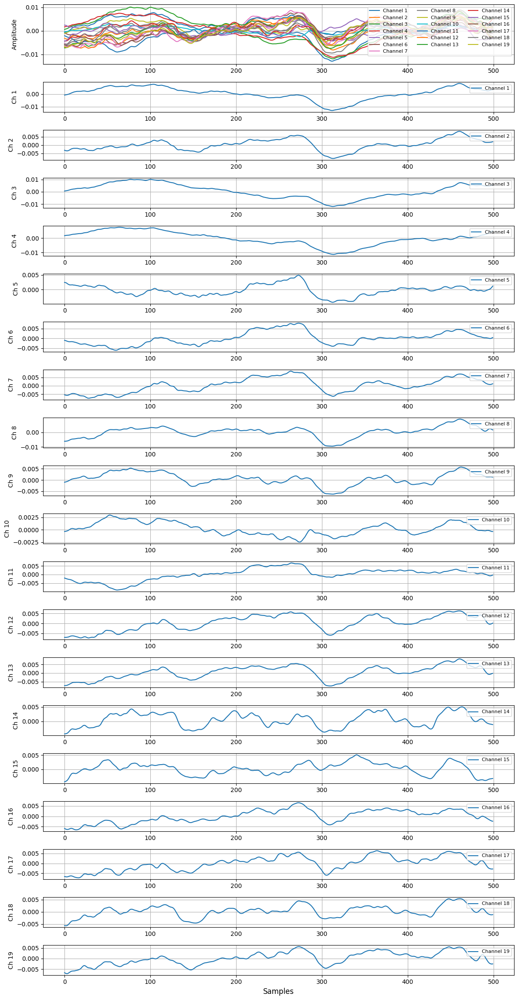

In [90]:
# Plotting EEG for normal data
norm = info(normal_data)

#### 2. Complex Partial Seizures

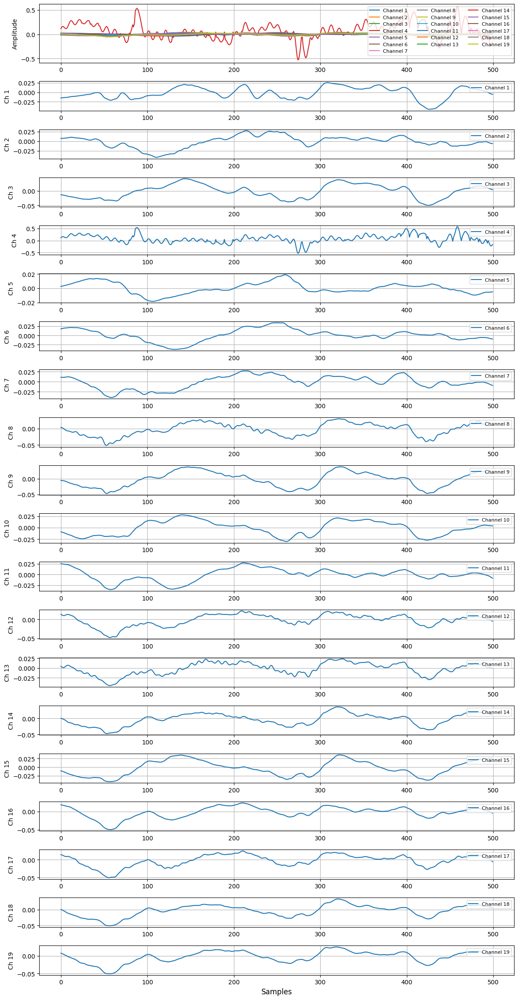

In [91]:
# Plotting EEG for Complex Partial Seizures
cps = info(cps_data)

#### 3. Video detected seizures

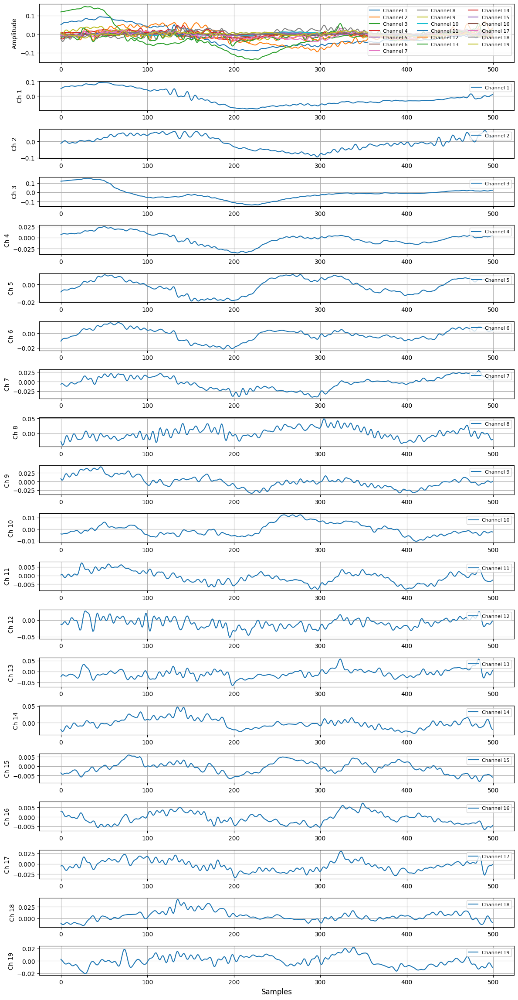

In [92]:
# Plotting EEG for Video detected seizures
video = info(video_data)

#### 4. Electrographic seizure data

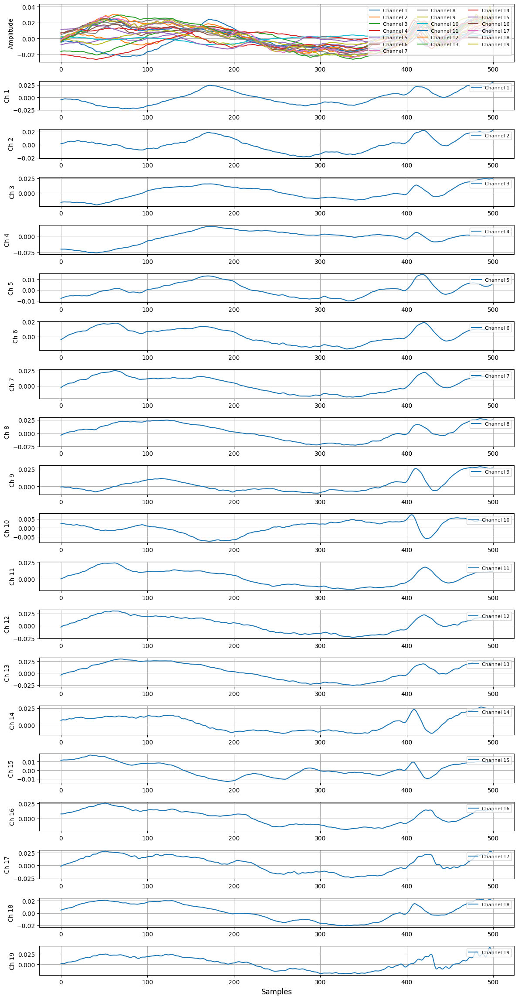

In [93]:
# Plotting EEG for Electrographic seizure data
seizure = info(seizure_data)

#### 5. Noisy data

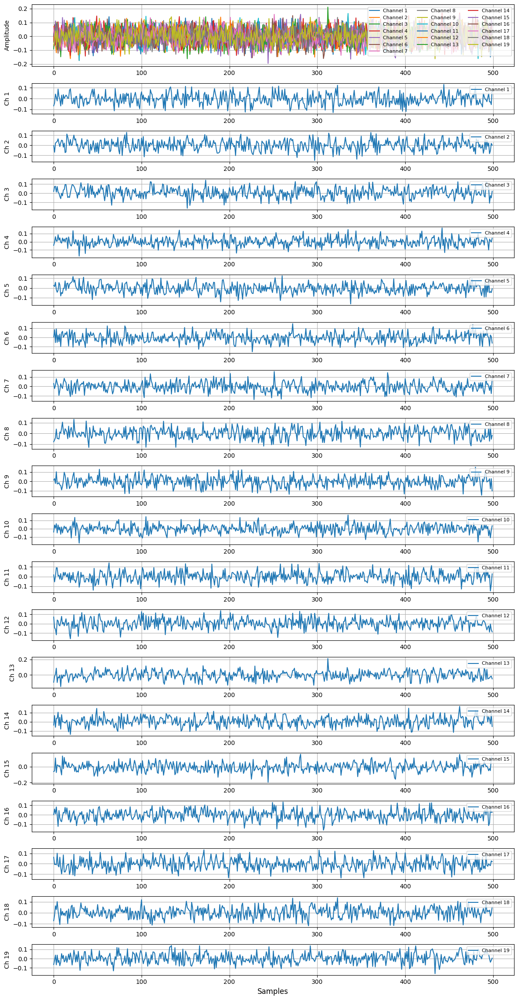

In [94]:
# Plotting EEG for Noisy data
noise = info(noise_data)

### Computing Basic Statistical Metrics: 

#### 1. Normal Data

In [95]:
norm.describe()

,Mean,Zero Crossing Rate,Range,Energy,RMS,Variance
count,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000
mean,0.000217,9.842105,0.014114,0.006353,0.003387,0.000013
std,0.000270,4.609931,0.004265,0.004153,0.001143,0.000008
min,-0.000292,2.000000,0.005463,0.000831,0.001289,0.000002
25%,0.000042,7.500000,0.011612,0.003476,0.002632,0.000007
50%,0.000245,10.000000,0.013672,0.005993,0.003462,0.000012
75%,0.000385,11.500000,0.016251,0.007279,0.003816,0.000014
max,0.000598,22.000000,0.022064,0.017421,0.005903,0.000035


#### 2. Complex Partial Seizures

In [96]:
cps.describe()

,Mean,Zero Crossing Rate,Range,Energy,RMS,Variance
count,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000
mean,0.001917,11.736842,0.126099,1.016649,0.025893,0.001754
std,0.017054,12.105289,0.235181,3.756921,0.037928,0.006320
min,-0.003664,5.000000,0.037415,0.033024,0.008127,0.000066
25%,-0.002746,8.000000,0.068604,0.122333,0.015641,0.000241
50%,-0.002000,9.000000,0.072632,0.134528,0.016403,0.000268
75%,-0.001439,10.500000,0.082184,0.184998,0.019234,0.000360
max,0.072171,61.000000,1.096070,16.528660,0.181817,0.027849


#### 3. Video detected seizures

In [97]:
video.describe()

,Mean,Zero Crossing Rate,Range,Energy,RMS,Variance
count,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000
mean,-0.003378,21.842105,0.079346,0.318678,0.018405,0.000603
std,0.004918,13.242453,0.068721,0.616937,0.017754,0.001178
min,-0.014527,2.000000,0.014007,0.004556,0.003019,0.000009
25%,-0.005448,10.500000,0.033456,0.035649,0.008442,0.000070
50%,-0.001808,22.000000,0.063884,0.098523,0.014037,0.000190
75%,-0.000662,32.000000,0.084469,0.151459,0.017405,0.000297
max,0.005029,48.000000,0.286106,2.373541,0.068899,0.004536


#### 4. Electrographic seizure data

In [98]:
seizure.describe()

,Mean,Zero Crossing Rate,Range,Energy,RMS,Variance
count,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000
mean,0.001681,5.894737,0.042309,0.079072,0.012085,0.000153
std,0.001553,1.760516,0.011221,0.040471,0.003572,0.000077
min,-0.001958,4.000000,0.014740,0.006578,0.003627,0.000013
25%,0.000495,5.000000,0.038528,0.055836,0.010566,0.000108
50%,0.002057,5.000000,0.042694,0.069797,0.011815,0.000135
75%,0.002944,6.000000,0.050781,0.110734,0.014860,0.000216
max,0.003780,10.000000,0.061951,0.161721,0.017984,0.000309


## Task 5: Extracting Frequency Domain Features

### Objective
To extract frequency-based features from EEG signals, providing insights into the frequency content of the signals. These features are critical for understanding brain activity and facilitating classification tasks in biomedical signal processing.

### Methods
1. **Fourier Transform**:
   - A mathematical technique used to transform a time-domain signal into the frequency domain.
   - Breaks down signals into their constituent sinusoidal components, revealing the frequencies present.

2. **Wavelet Decomposition**:
   - A technique that provides both time and frequency information, addressing the limitations of the Fourier Transform.
   - Breaks the signal into smaller wavelets, capturing high-frequency (fast changes) and low-frequency (slow changes) components.
   - **Approximation Coefficients**: Represent low-frequency components (general signal shape).
   - **Detail Coefficients**: Represent high-frequency components (fast variations).

### Deliverables
1. Extract frequency-domain features for each data point in the train dataset.
2. Present extracted features for at least one data point from each class.

---

## Task 5.1: Detailed Wavelet Analysis and Spectrograms

### Objective
Perform a detailed analysis of EEG signals using Wavelet Decomposition and generate spectrograms to visualize time-frequency characteristics.

### Methods
1. **Wavelet Decomposition**:
   - Decompose the signal into 4 levels.
   - Present the **Approximation Coefficients** and **Detail Coefficients** channel-wise.
   - Identify the coefficient most similar to the original signal for a given channel.

2. **Spectrogram Analysis**:
   - Generate and analyze spectrograms for a data point to visualize and interpret time-frequency characteristics.

### Deliverables
1. Present Wavelet Decomposition results for 4 levels:
   - Include coefficients for each channel.
   - Highlight the most similar coefficient to the original signal for one channel.
2. Spectrogram visualizations for a selected data point across channels.


### Fourier Transform and Plotting Documentation

#### `apply_fourier_transform(data)`
- **Purpose**: Converts EEG signals `(19, 500)` from time domain to frequency domain.
- **Inputs**: 
  - `data`: 2D array of shape `(19, 500)`, each row is an EEG signal.
- **Outputs**:
  - `fft_data`: FFT results (complex values).
  - `magnitude`: Magnitude of the FFT.
  - `freqs`: Frequency values.
  - `phase`: Phase information.

#### `plotfft(freqs, magnitude)`
- **Purpose**: Visualizes FFT magnitudes for EEG channels.
- **Inputs**: 
  - `freqs`: Frequency values from `apply_fourier_transform`.
  - `magnitude`: Magnitude values from `apply_fourier_transform`.
- **Outputs**: 
  - Combined plot of all channels.
  - Individual plots for each of the 19 channels.

In [99]:
# Function to apply Fourier Transform
def apply_fourier_transform(data):
    """
    Applies the Fourier Transform to a 2D array of shape (19, 500).
    Each row (channel) will have its Fourier Transform applied.

    Args:
        data (numpy.ndarray): A 2D array of shape (19, 500), where each row represents a signal.

    Returns:
        numpy.ndarray: A 2D array of the same shape, where each row represents the frequency components
                        of the corresponding signal in the original data.
    """
    # Perform the Fast Fourier Transform (FFT) along the second axis (axis=1)
    fft_data = np.fft.fft(data, axis=1)
    phase = np.angle(fft_data)
    # Compute the magnitude of the FFT
    magnitude = np.abs(fft_data)
    
    # Optionally, you can also compute the corresponding frequencies (x-axis for plotting)
    num_samples = data.shape[1]
    sample_rate = 0.002  # Adjust this based on your actual sampling rate (if known)
    freqs = np.fft.fftfreq(num_samples, d=sample_rate)

    return fft_data, magnitude, freqs, phase


In [100]:
# Function to plot FFT
def plotfft(freqs, magnitude):
    # Plot the magnitude of the Fourier Transform 
    fig, axes = plt.subplots(nrows=20, ncols=1, figsize=(12, 24), gridspec_kw={"height_ratios": [1] + [0.5]*19})

    
    for i in range(19):
        axes[0].plot(freqs[:30], magnitude[i, :30], label = f"Channel {i+1}")
        axes[0].legend(loc="upper right", fontsize=8, ncol=3)
        axes[0].set_ylabel("Amplitude")
        axes[0].grid(True)

        axes[i+1].plot(freqs[:30], magnitude[i, :30], label = f"Channel {i+1}")
        axes[i+1].legend(loc="upper right", fontsize=8, ncol=3)
        axes[i+1].grid(True)
        axes[i+1].set_ylabel(f"Ch {i+1}")
        
    plt.xlabel("Frequency", fontsize=12)
    # Adjust layout for better spacing
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for the title
    plt.show()
    

#### 1. Normal Data

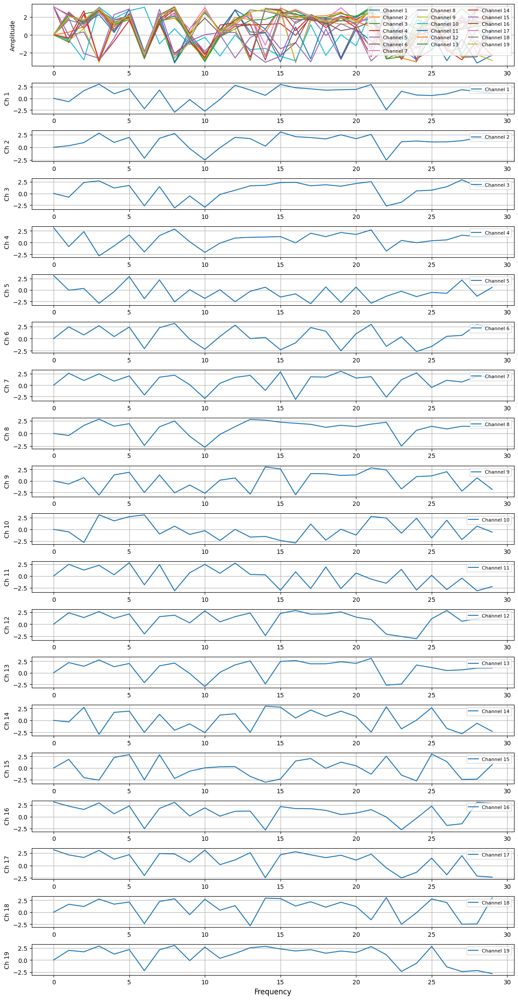

In [101]:
# Apply Fourier Transform to Normal data
fft_data, magnitude, freqs, phase = apply_fourier_transform(normal_data)
plotfft(freqs,phase)

#### 2. Complex Partial Seizures

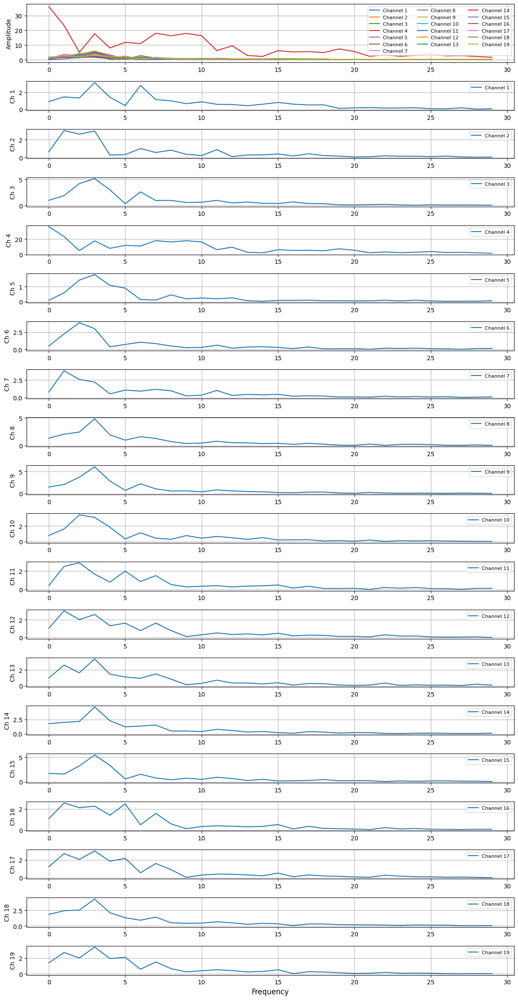

In [102]:
# Apply Fourier Transform to CPS data
fft_data, magnitude, freqs, phase = apply_fourier_transform(cps_data)
plotfft(freqs,magnitude)

#### 3. Video detected seizures

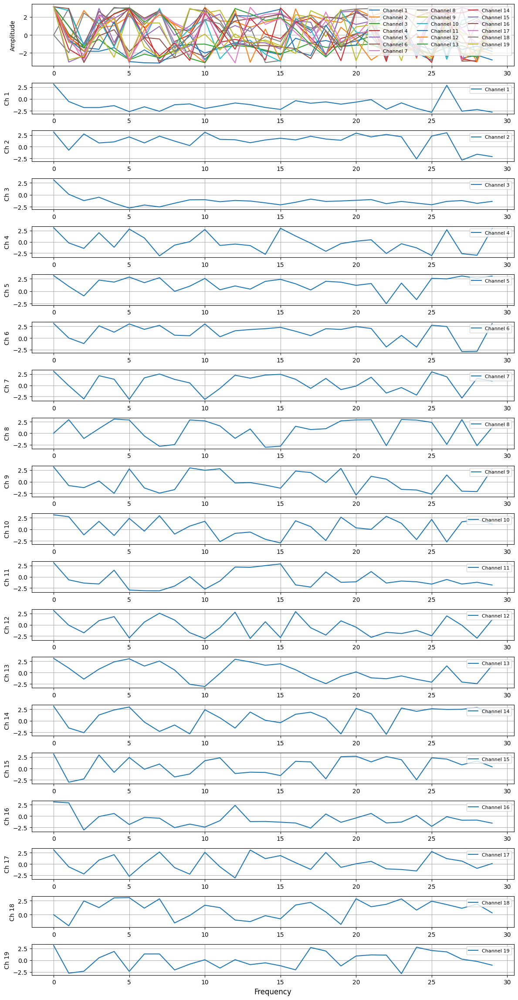

In [103]:
# Apply Fourier Transform to Video detected seizures
fft_data, magnitude, freqs,phase = apply_fourier_transform(video_data)
plotfft(freqs,phase)

#### 4. Electrographic seizure data

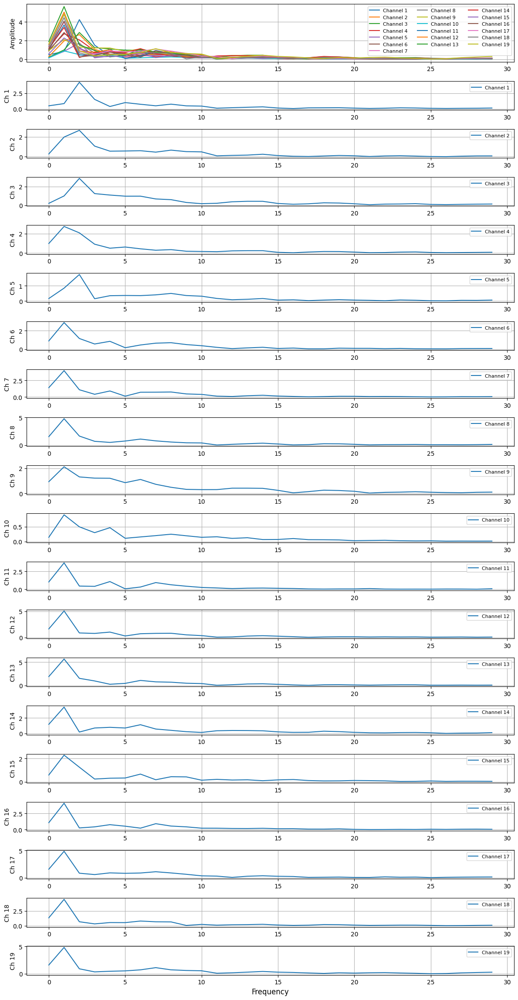

In [104]:
# Apply Fourier Transform to Electrogrphic seizure data
fft_data, magnitude, freqs , phase  = apply_fourier_transform(seizure_data)
plotfft(freqs,magnitude)

#### 5. Noisy data

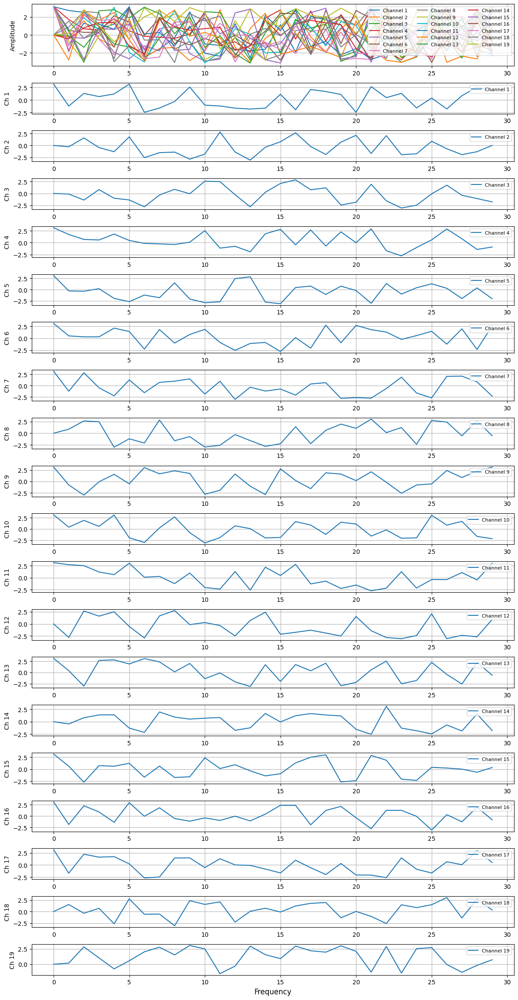

In [105]:
# Apply Fourier Transform to Noisy data
fft_data, magnitude, freqs,phase = apply_fourier_transform(noise_data)
plotfft(freqs,phase)

### Discrete Wavelet Transform (DWT) and Plotting Documentation

#### `dwt_4_level(data, wavelet='db1')`
- **Purpose**: Applies a 4-level Discrete Wavelet Transform (DWT) to the input EEG data.
- **Inputs**:
  - `data`: 1D or 2D array representing the signal.
  - `wavelet`: Wavelet type to use (default is 'db1', the Haar wavelet).
- **Outputs**:
  - A list of approximation and detail coefficients for each level of decomposition.

#### `plotdwt(freqs, magnitude)`
- **Purpose**: Visualizes the DWT magnitudes for EEG channels.
- **Inputs**: 
  - `freqs`: Frequency values from the DWT.
  - `magnitude`: Magnitude values from the DWT.
- **Outputs**:
  - Combined plot of all channels.
  - Individual plots for each of the 19 channels.


In [106]:
# Function to apply Discrete Wavelet Transform on 4levels
def dwt_4_level(data, wavelet='db1'):
    """
    Applies a 4-level Discrete Wavelet Transform (DWT) to the input data.
    
    Args:
        data (numpy.ndarray): 1D or 2D array representing the signal.
        wavelet (str): The wavelet to use (default is 'db1' which is the Haar wavelet).
    
    Returns:
        list: A list of approximation and detail coefficients for each level of decomposition.
    """
    coeffmatrix = []
    for j in range(19):
        coeffs = []
        
        # Perform the 4-level DWT
        # At each level, store the approximation (cA) and details (cD)
        for i in range(4):
            data, cD = pywt.dwt(data, wavelet)
            coeffs.append((data, cD))  # Append approximation and detail coefficients
        coeffmatrix.append(coeffs)
        
    return coeffmatrix



In [107]:
# Function to plot DWT
def plotdwt(freqs, magnitude):
    # Plot the magnitude of the Fourier Transform 
    fig, axes = plt.subplots(nrows=20, ncols=1, figsize=(12, 24), gridspec_kw={"height_ratios": [1] + [0.5]*19})

    
    for i in range(19):
        axes[0].plot(freqs[:30], magnitude[i, :30], label = f"Channel {i+1}")
        axes[0].legend(loc="upper right", fontsize=8, ncol=3)
        axes[0].set_ylabel("Amplitude")
        axes[0].grid(True)

        axes[i+1].plot(freqs[:30], magnitude[i, :30], label = f"Channel {i+1}")
        axes[i+1].legend(loc="upper right", fontsize=8, ncol=3)
        axes[i+1].grid(True)
        axes[i+1].set_ylabel(f"Ch {i+1}")
        
    plt.xlabel("Frequency", fontsize=12)
    # Adjust layout for better spacing
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for the title
    plt.show()

In [108]:
# Function to DWT
def dwt():
    normaleg,_ = normaldataset[9]
    normal_data = np.array(normaleg)
    
    
    # Create a sample signal
    plt.figure(figsize=(12, 10))
    signalog = normal_data[7]
    t = np.linspace(0, 16, 63)
    print(len(t))
    t_new = np.linspace(0,1,500)
    
    plt.subplot(6, 1, 6)
    plt.plot(signalog)
    plt.title("Original Signal")
    
    # Perform 4-level DWT on the signal
    wavelet = 'db1'  # Haar wavelet
    coeffs = dwt_4_level(signalog, wavelet)
        
    # Plot the approximation and detail coefficients for each level
    for i, (approx, detail) in enumerate(coeffs[0]):
        plt.subplot(6, 1, i+2)
        
        approx = resample(approx, 500)
        detail = resample(detail, 500)
        plt.plot(approx, label=f"Level {i+1} Approximation")
        plt.plot(detail, label=f"Level {i+1} Detail", linestyle='--')
        plt.title(f"Level {i+1} Coefficients")
        plt.legend()
    
    plt.tight_layout()
    plt.show()
    

In [109]:
#### 1. Normal Data

63


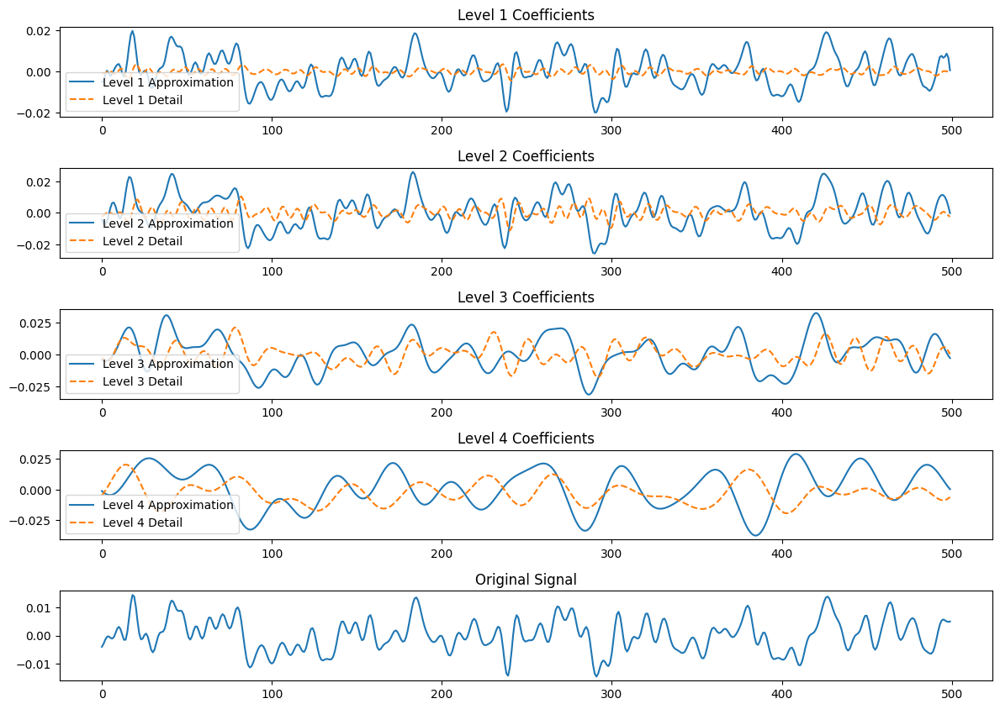

In [110]:
dwt()

### Spectrogram Plotting Documentation

#### `plot_spectrograms(data, fs=500, nperseg=256, noverlap=None, colormap='viridis')`
- **Purpose**: Generates and plots spectrograms for multi-channel EEG data.
- **Inputs**:
  - `data`: 2D array (channels x samples) representing multi-channel data.
  - `fs`: Sampling frequency in Hz (default is 500 Hz).
  - `nperseg`: Number of samples per segment for the spectrogram (default is 256).
  - `noverlap`: Number of overlapping samples between segments (default is `nperseg // 2`).
  - `colormap`: Colormap to use for the spectrogram (default is 'viridis').
- **Outputs**: 
  - Spectrograms plotted for each channel showing frequency vs. time, with power in dB/Hz.



In [111]:
def plot_spectrograms(data, fs = 500, nperseg=256, noverlap=None, colormap='viridis'):
    """
    Generate and plot spectrograms for multi-channel data
    Parameters:
    - data (numpy.ndarray): Multi-channel data as a 2D array (channels x samples).
    - fs (int): Sampling frequency (Hz).
    - nperseg (int): Number of samples per segment (default=256).
    - noverlap (int): Number of overlapping samples (default=None, which sets it to nperseg//2).
    - colormap (str): Colormap for the spectrogram (default='viridis').

    Returns:
    None
    """
    # Ensure data is a 2D array
    if len(data.shape) == 1:
        data = data[np.newaxis, :]  # Convert 1D data to 2D (1 channel)

    num_channels = data.shape[0]
    for i in range(num_channels):
        f, t, Sxx = spectrogram(data[i], fs=fs, nperseg=nperseg, noverlap=noverlap)
        
        # Plot the spectrogram
        plt.figure(figsize=(10, 6))
        plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud', cmap=colormap)
        plt.title(f"Spectrogram for Channel {i + 1}")
        plt.ylabel("Frequency (Hz)")
        plt.xlabel("Time (s)")
        plt.colorbar(label="Power/Frequency (dB/Hz)")
        plt.show()

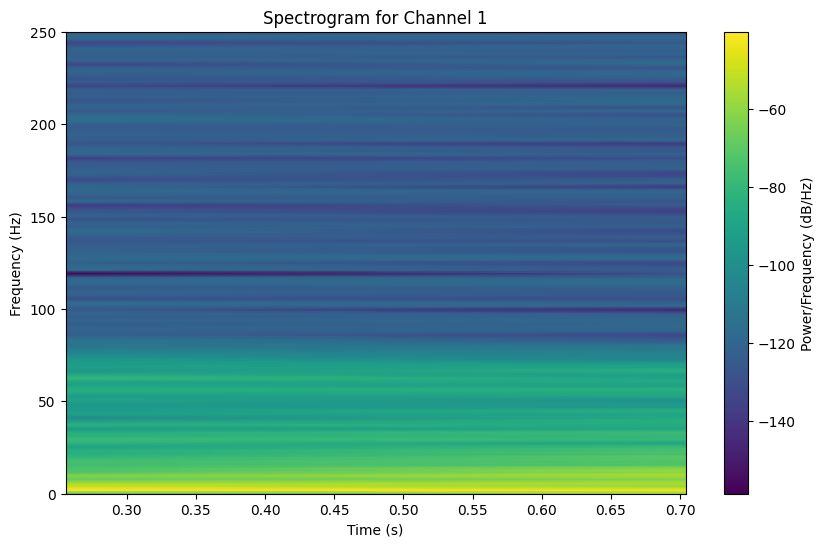

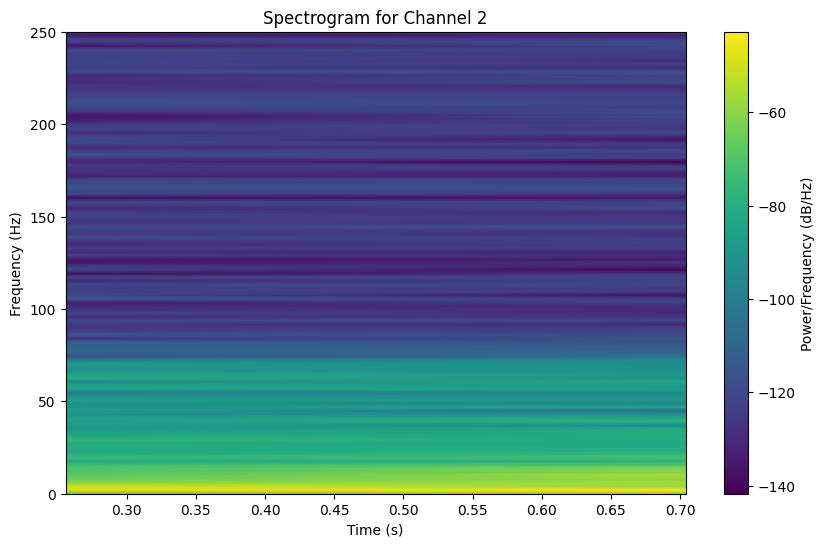

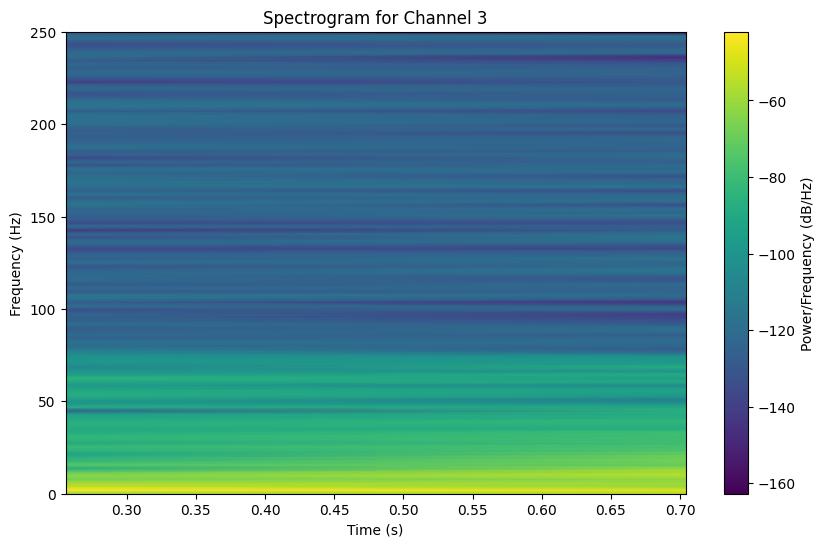

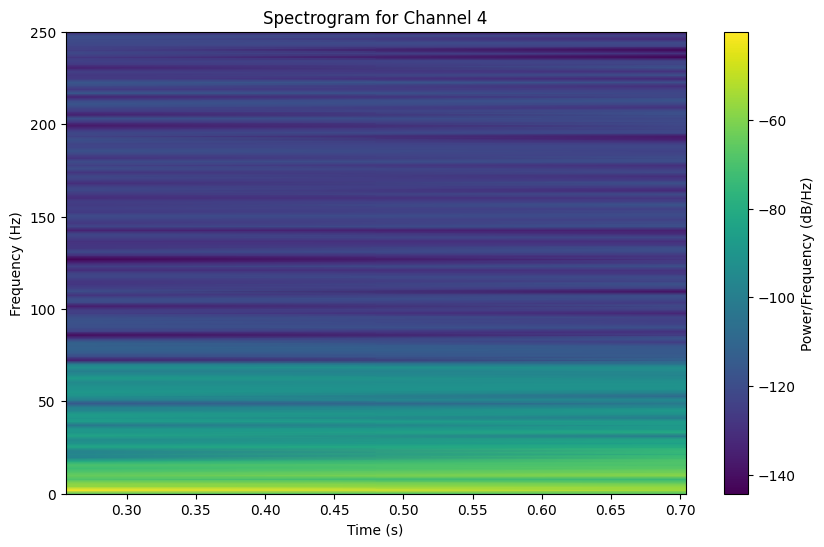

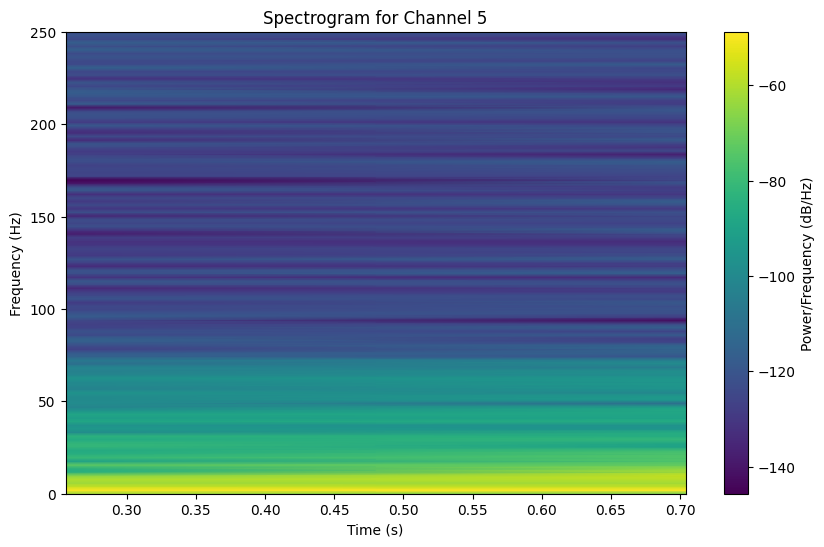

...

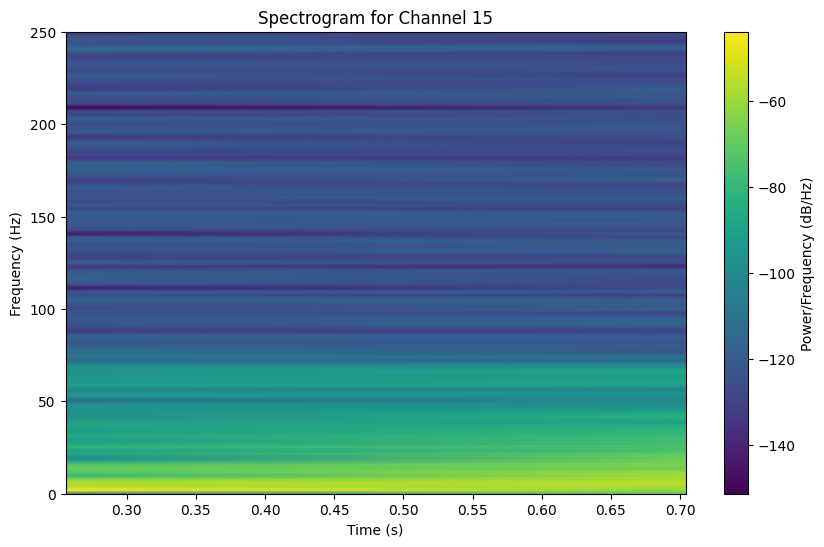

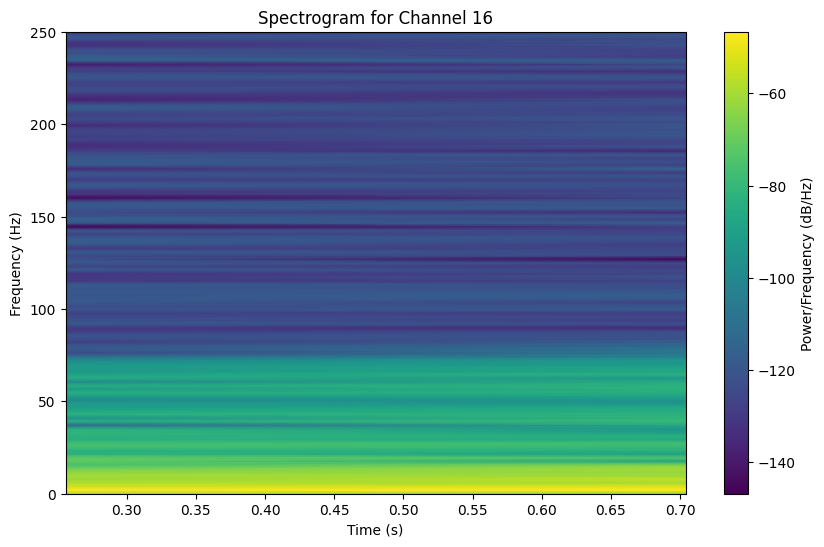

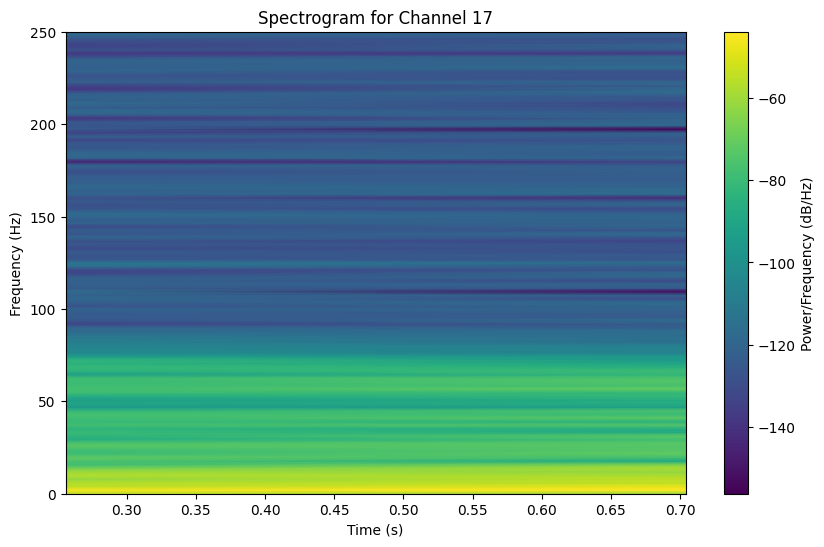

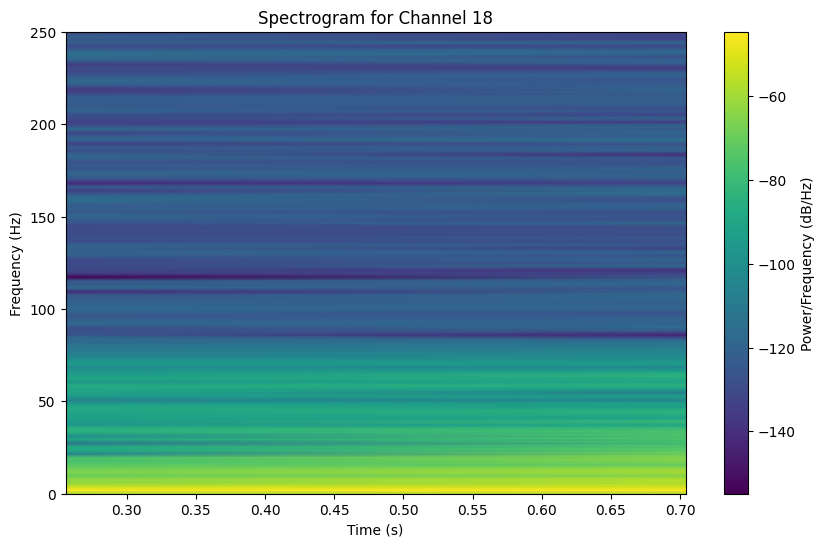

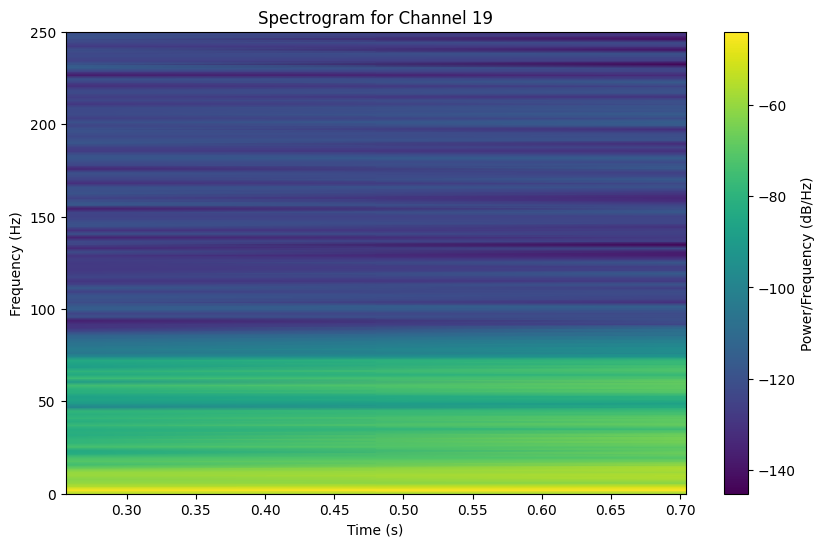

In [112]:
plot_spectrograms(seizure_data)

## Task 6: Building the Baseline Model

### Objective
The goal of this task is to build a baseline machine learning model using the Fourier features and Zero Crossing Rate (ZCR) extracted from the EEG signals. The baseline model serves as a starting point to measure performance and guide improvements.

### Methods
1. **Feature Extraction**:
   - **Fourier Features**: Use the Fourier Transform results (amplitude and phase) from previous tasks to capture the frequency characteristics of the EEG signals.
   - **Zero Crossing Rate (ZCR)**: This feature measures the number of times the signal crosses zero. It helps identify the frequency content of the signal and its variability.

2. **Modeling with Support Vector Machine (SVM)**:
   - SVM is a powerful classification model that will be used to classify EEG signals based on the extracted features.
   - The model will be trained on the extracted features and evaluated on the validation set.

3. **Evaluation**:
   - The model will be evaluated using the following metrics:
     - **Classification Report**: Provides precision, recall, and F1-score for each class.
     - **ROC AUC Score**: Measures the area under the receiver operating characteristic curve, indicating the model's ability to distinguish between classes.
     - **Balanced Accuracy**: Averages the accuracy per class, compensating for class imbalances.

### Deliverables
1. A baseline SVM model trained using the Fourier features and Zero Crossing Rate extracted from the training data.
2. The classification report, ROC AUC score, and balanced accuracy score for the model evaluated on the validation set.

In [113]:
# This was intially done in another notebook but later exported 
base_path = "/kaggle/input/impulse/Impulse/EEG_Data"
train_path = os.path.join(base_path, "/kaggle/input/impulse/Impulse/EEG_Data/train_data")
val_path = os.path.join(base_path, "/kaggle/input/impulse/Impulse/EEG_Data/validation_data")
test_path = os.path.join(base_path, "/kaggle/input/impulse/Impulse/EEG_Data/test_data")

class_map = {
    "Normal": 0,
    "Complex_Partial_Seizures": 1,
    "Electrographic_Seizures": 2,
    "Video_detected_Seizures_with_no_visual_change_over_EEG": 3,
}

def load_labeled_data(data_path, class_map):
    data, labels = [], []
    for class_name, label in class_map.items():
        class_folder = os.path.join(data_path, class_name)
        if os.path.exists(class_folder):
            for file in os.listdir(class_folder):
                if file.endswith(".npy"):
                    sample = np.load(os.path.join(class_folder, file))
                    data.append(sample)
                    labels.append(label)
    return np.array(data), np.array(labels)

def load_unlabeled_data(data_path):
    data, filenames = [], []
    for file in os.listdir(data_path):
        if file.endswith(".npy"):
            sample = np.load(os.path.join(data_path, file))
            data.append(sample)
            filenames.append(file)
    return np.array(data), filenames

In [114]:
# Data Loading
train_data, train_labels = load_labeled_data(train_path, class_map)
val_data, val_labels = load_labeled_data(val_path, class_map)
test_data, test_filenames = load_unlabeled_data(test_path)

In [115]:
# Normalize Data
def normalize_data(data):
    mean = data.mean(axis=(0, 2), keepdims=True)
    std = data.std(axis=(0, 2), keepdims=True) + 1e-8
    return (data - mean) / std

train_data = normalize_data(train_data)
val_data = normalize_data(val_data)
test_data = normalize_data(test_data)

In [116]:
# Function to extract features
def extract_features(data):
    """
    Extract FFT and ZCR features from EEG data.
    Args:
        data (numpy array): Shape (num_samples, num_channels, num_points)
    Returns:
        features (numpy array): Extracted features of shape (num_samples, total_features)
    """
    num_samples, num_channels, num_points = data.shape
    fft_features = []
    zcr_features = []

    for sample in range(num_samples):
        sample_fft_features = []
        sample_zcr_features = []
        
        for channel in range(num_channels):
            # Fourier Transform (FFT)
            fft = np.fft.rfft(data[sample, channel])
            fft_magnitude = np.abs(fft)  # Take magnitude
            sample_fft_features.extend(fft_magnitude)

            # Zero Crossing Rate (ZCR)
            signal = data[sample, channel]
            zcr = ((signal[:-1] * signal[1:]) < 0).sum()  # Count zero crossings
            sample_zcr_features.append(zcr)
        
        fft_features.append(sample_fft_features)
        zcr_features.append(sample_zcr_features)

    # Combine FFT and ZCR features
    fft_features = np.array(fft_features)  # Shape: (num_samples, num_channels * fft_length)
    zcr_features = np.array(zcr_features)  # Shape: (num_samples, num_channels)
    return np.hstack((fft_features, zcr_features))  # Concatenate along feature axis

# Extract features
train_features = extract_features(train_data)  # Shape: (num_samples, total_features)
val_features = extract_features(val_data)      # Shape: (num_samples, total_features)
test_features = extract_features(test_data)    # Shape: (num_samples, total_features)

# Normalize features
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
val_features = scaler.transform(val_features)
test_features = scaler.transform(test_features)

#### Intialising SVM model

In [117]:
svm_model = SVC(kernel='rbf', C=1.0, gamma='scale')  # You can tune hyperparameters
svm_model.fit(train_features, train_labels)

SVC()

#### Generating the confusion matrix

SVM Validation Accuracy: 0.9152
SVM Balanced Accuracy: 0.8003
SVM F1 Score: 0.9134
SVM ROC AUC Score: 0.9651
SVM Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.99      0.93       696
           1       0.95      0.85      0.90       549
           2       0.98      0.89      0.93       137
           3       1.00      0.48      0.65        21

    accuracy                           0.92      1403
   macro avg       0.95      0.80      0.85      1403
weighted avg       0.92      0.92      0.91      1403



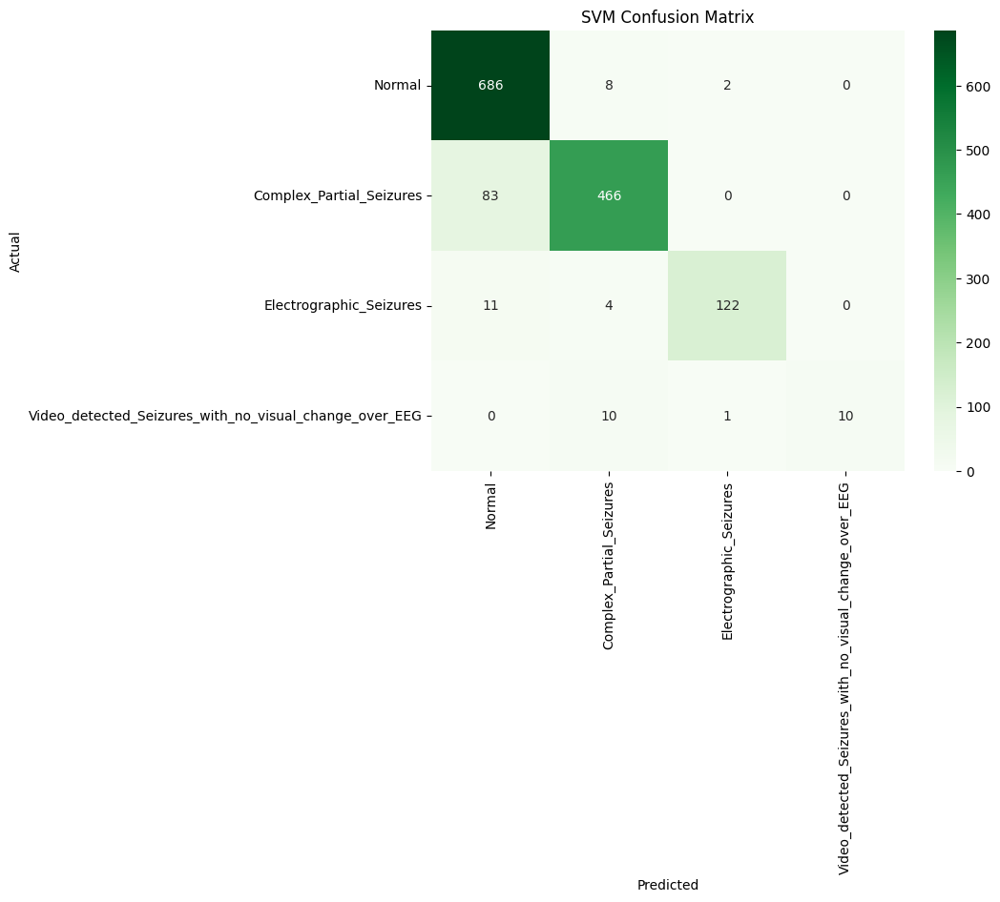

In [118]:
# Evaluate on validation set
val_predictions = svm_model.predict(val_features)
val_probabilities = svm_model.decision_function(val_features)  # Use decision_function for SVM probabilities

# Calculate metrics
val_accuracy = accuracy_score(val_labels, val_predictions)
val_balanced_accuracy = balanced_accuracy_score(val_labels, val_predictions)
val_f1_score = f1_score(val_labels, val_predictions, average='weighted')

# Calculate ROC AUC Score (multi-class One-vs-Rest approach)
val_roc_auc = roc_auc_score(
    pd.get_dummies(val_labels),  # Convert true labels to one-hot encoding
    val_probabilities,          # Decision function output
    multi_class='ovr',
    average='weighted'
)

# Confusion Matrix
conf_matrix = confusion_matrix(val_labels, val_predictions)

# Print Metrics
print(f"SVM Validation Accuracy: {val_accuracy:.4f}")
print(f"SVM Balanced Accuracy: {val_balanced_accuracy:.4f}")
print(f"SVM F1 Score: {val_f1_score:.4f}")
print(f"SVM ROC AUC Score: {val_roc_auc:.4f}")
print("SVM Classification Report:")
print(classification_report(val_labels, val_predictions))

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens', xticklabels=class_map.keys(), yticklabels=class_map.keys())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('SVM Confusion Matrix')
plt.show()

#### saving the predicition into svm

In [119]:
test_predictions = svm_model.predict(test_features)

# Save predictions for unlabeled test data
results = pd.DataFrame({"Filename": test_filenames, "Prediction": test_predictions})
results.to_csv("/kaggle/working/model_test_predictions.csv", index=False)
print("Test predictions saved to test_predictions.csv.")

Test predictions saved to test_predictions.csv.


## Task 7: Building the Best Model

### Objective
In this task, you will build the best performing model by improving upon the baseline SVM model. The goal is to explore advanced techniques for feature extraction, hyperparameter tuning, and potentially using more sophisticated models, including deep learning models, to achieve the highest possible performance.

### Methods
1. **Feature Exploration**:
   - Experiment with additional feature extraction methods beyond the ones used in the baseline model.
   - Consider using more advanced techniques like spectral features, statistical measures, or time-frequency representations that may enhance the model's performance.

2. **Modeling**:
   - You are encouraged to explore different machine learning algorithms, including but not limited to:
     - **Deep Learning Models**: Such as Convolutional Neural Networks (CNNs) or Recurrent Neural Networks (RNNs) for temporal data.
     - **Other Classifiers**: Such as Random Forests, Gradient Boosting Machines, or XGBoost.
   - The model should be trained on the training set only (do not use the validation set for training).

3. **Hyperparameter Tuning**:
   - Fine-tune the model's hyperparameters using cross-validation or grid search to find the optimal set of parameters for the best performance.

4. **Model Evaluation**:
   - Evaluate the performance on the validation set, but ensure that the model is trained on the training set only.
   - Report the total number of model parameters (trainable and non-trainable). Models with fewer parameters are encouraged.
   - Submit the test outputs in a CSV file, formatted according to the specifications.

### Deliverables
1. **Best Model**: The final model trained using advanced techniques and optimized hyperparameters.
2. **Model Parameters**: A report on the total number of parameters in the model.
3. **Test Outputs**: The CSV file containing the model's predictions on the test set, formatted as required.


In [120]:
def initialize_weights(module):
    if isinstance(module, (nn.Conv1d, nn.Linear)):
            nn.init.kaiming_normal_(module.weight, nonlinearity='leaky_relu')
            if module.bias is not None:
                nn.init.constant_(module.bias, 0)


In [121]:
class EEGDataset(Dataset):
    def __init__(self, data, labels=None, augment=False):
        self.data = torch.tensor(data, dtype=torch.float32)
        print(f"Data shape: {self.data.shape}")  # Debug: Confirm shape
        self.labels = torch.tensor(labels, dtype=torch.long) if labels is not None else None
        self.augment = augment # Augmentation flag

    def __len__(self):
        return len(self.data)  # Number of samples

    def __getitem__(self, idx):
        # Retrieve sample and (optionally) add noise
        sample = self.data[idx]
        if self.augment:
            sample = self.add_noise(sample.numpy())
        if self.labels is not None:
            return sample, self.labels[idx]  # Return sample with label
        return sample  # Return only sample for test data

    def add_noise(self, sample, noise_level=0.05):
        # Add Gaussian noise for augmentation
        noise = np.random.randn(*sample.shape) * noise_level
        return torch.tensor(sample + noise, dtype=torch.float32)

In [122]:
train_data, train_labels = load_labeled_data(train_path, class_map)
val_data, val_labels = load_labeled_data(val_path, class_map)
test_data, test_filenames = load_unlabeled_data(test_path)

train_data = normalize_data(train_data)
val_data = normalize_data(val_data)
test_data = normalize_data(test_data)

train_dataset = EEGDataset(train_data, train_labels, augment=True)
val_dataset = EEGDataset(val_data, val_labels)
test_dataset = EEGDataset(test_data)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)

Data shape: torch.Size([5608, 19, 500])
Data shape: torch.Size([1403, 19, 500])
Data shape: torch.Size([779, 19, 500])


In [123]:
class CNN(nn.Module):
    def __init__(self, input_channels, input_length, num_classes):
        super(CNN, self).__init__()
        
        self.conv1 = nn.Conv1d(input_channels, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv1d(32, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool1d(2)
        self.relu = nn.ReLU()
        self.batch_norm = nn.BatchNorm1d(64)
        self.dropout = nn.Dropout(0.5)

        # Compute flattened size
        dummy_input = torch.zeros(1, input_channels, input_length)
        self.flattened_size = self._get_flattened_size(dummy_input)
        
        # Fully connected layers
        self.fc1 = nn.Linear(self.flattened_size, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, num_classes)
    
    def _get_flattened_size(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        return x.view(x.size(0), -1).size(1)
    
    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.batch_norm(x)
        x = x.view(x.size(0), -1)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

In [124]:
num_classes = len(class_map)
input_channels = train_data.shape[1]  # Features dimension (19)
input_length = train_data.shape[2]    # Sequence length (500)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = CNN(input_channels, input_length, num_classes).to(device)

cuda


In [125]:
class_weights = compute_class_weight('balanced', classes=np.unique(train_labels), y=train_labels)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, min_lr=1e-6)

In [126]:
for batch in train_loader:
    data, labels = batch
    print(f"Data shape: {data.shape}, Labels shape: {labels.shape}")
    break

Data shape: torch.Size([32, 19, 500]), Labels shape: torch.Size([32])


In [127]:
def validate_model(model, val_loader, criterion, device):
    model.eval()
    val_loss, val_correct = 0.0, 0
    with torch.no_grad():
        for data, labels in val_loader:
            data, labels = data.to(device), labels.to(device)
            outputs = model(data)
            loss = criterion(outputs, labels)

            val_loss += loss.item() * data.size(0)
            val_correct += (outputs.argmax(1) == labels).sum().item()

    avg_loss = val_loss / len(val_loader.dataset)
    avg_acc = val_correct / len(val_loader.dataset)
    return avg_loss, avg_acc


def save_checkpoint(model, path):
    torch.save(model.state_dict(), path)


def train_model(
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler=None, 
    num_epochs=30, 
    patience=7, 
    early_stopping=True, 
    grad_clip=None, 
    device="cuda"
):
    best_val_loss = float("inf")
    epochs_no_improve = 0
    history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}

    for epoch in range(num_epochs):
        epoch_start_time = time.time()
        model.train()
        train_loss, train_correct = 0.0, 0

        for data, labels in train_loader:
            data, labels = data.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, labels)
            loss.backward()

            if grad_clip is not None:
                torch.nn.utils.clip_grad_norm_(model.parameters(), grad_clip)

            optimizer.step()

            train_loss += loss.item() * data.size(0)
            train_correct += (outputs.argmax(1) == labels).sum().item()

        train_loss /= len(train_loader.dataset)
        train_acc = train_correct / len(train_loader.dataset)

        val_loss, val_acc = validate_model(model, val_loader, criterion, device)

        if scheduler:
            scheduler.step(val_loss)

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        epoch_end_time = time.time()
        print(
            f"Epoch {epoch+1}/{num_epochs} | "
            f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
            f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f} | "
            f"Time: {epoch_end_time - epoch_start_time:.2f}s"
        )

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            save_checkpoint(model, "best_model_weights.pth")
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1

            if early_stopping and epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

    model.load_state_dict(torch.load("best_model_weights.pth"))
    return model, history

In [128]:
trained_model, history = train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=30)

Epoch 1/30 | Train Loss: 0.8112, Train Acc: 0.7307 | Val Loss: 0.4742, Val Acc: 0.8218 | Time: 1.73s
Epoch 2/30 | Train Loss: 0.5725, Train Acc: 0.7866 | Val Loss: 0.4138, Val Acc: 0.8475 | Time: 1.75s
Epoch 3/30 | Train Loss: 0.3631, Train Acc: 0.8356 | Val Loss: 0.4338, Val Acc: 0.8318 | Time: 1.68s
Epoch 4/30 | Train Loss: 0.3288, Train Acc: 0.8483 | Val Loss: 0.3319, Val Acc: 0.8624 | Time: 1.75s
Epoch 5/30 | Train Loss: 0.2948, Train Acc: 0.8570 | Val Loss: 0.3571, Val Acc: 0.8560 | Time: 1.79s
Epoch 6/30 | Train Loss: 0.2767, Train Acc: 0.8686 | Val Loss: 0.3136, Val Acc: 0.8767 | Time: 1.74s
Epoch 7/30 | Train Loss: 0.2944, Train Acc: 0.8713 | Val Loss: 0.3213, Val Acc: 0.8717 | Time: 1.77s
Epoch 8/30 | Train Loss: 0.2155, Train Acc: 0.8839 | Val Loss: 0.2847, Val Acc: 0.8909 | Time: 1.75s
Epoch 9/30 | Train Loss: 0.2324, Train Acc: 0.8857 | Val Loss: 0.3626, Val Acc: 0.8795 | Time: 1.77s
Epoch 10/30 | Train Loss: 0.2284, Train Acc: 0.8795 | Val Loss: 0.2534, Val Acc: 0.9102 | T

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Validation Classification Report:
                          precision    recall  f1-score   support

                  Normal       0.88      0.96      0.92       696
Complex Partial Seizures       0.96      0.84      0.90       549
 Electrographic Seizures       0.92      0.96      0.94       137
 Video-detected Seizures       0.83      0.95      0.89        21

                accuracy                           0.91      1403
               macro avg       0.90      0.93      0.91      1403
            weighted avg       0.91      0.91      0.91      1403

Balanced Accuracy Score: 0.9282
ROC AUC Score: 0.9868
Confusion matrix saved to: confusion_matrix.png


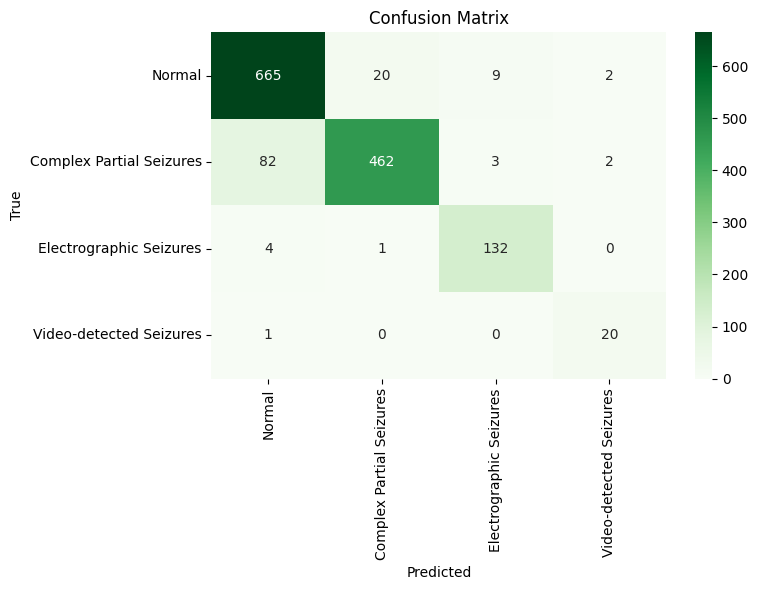

In [129]:
def evaluate_model(
    model, val_loader, class_names, device="cuda", plot_cm=True, save_cm_path='/kaggle/working/'
):
    """
    Evaluates the model on the validation set and provides detailed metrics.
    
    Args:
        model (torch.nn.Module): The trained model.
        val_loader (DataLoader): Validation DataLoader.
        class_names (list): List of class names.
        device (str): Device to run the evaluation on (default: "cuda").
        plot_cm (bool): Whether to plot the confusion matrix (default: True).
        save_cm_path (str): File path to save the confusion matrix plot (optional).
    
    Returns:
        dict: A dictionary with evaluation metrics.
    """
    
    model.eval()
    val_preds, val_labels, val_probs = [], [], []

    with torch.no_grad():
        for data, labels in val_loader:
            data, labels = data.to(device), labels.to(device)
            outputs = model(data)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            preds = outputs.argmax(1).cpu().numpy()

            val_preds.extend(preds)
            val_probs.extend(probs)
            val_labels.extend(labels.cpu().numpy())

    # Classification Report
    report = classification_report(val_labels, val_preds, target_names=class_names, output_dict=True)
    print("Validation Classification Report:")
    print(classification_report(val_labels, val_preds, target_names=class_names))

    # Balanced Accuracy Score
    balanced_acc = balanced_accuracy_score(val_labels, val_preds)
    print(f"Balanced Accuracy Score: {balanced_acc:.4f}")

    # ROC AUC Score (Binary or Multi-Class)
    roc_auc = None
    try:
        if len(class_names) == 2:
            roc_auc = roc_auc_score(val_labels, [p[1] for p in val_probs])
        else:
            roc_auc = roc_auc_score(val_labels, val_probs, multi_class='ovr')
        print(f"ROC AUC Score: {roc_auc:.4f}")
    except ValueError:
        print("ROC AUC Score could not be computed. Check data or labels.")

    # Confusion Matrix
    cm = confusion_matrix(val_labels, val_preds)
    if plot_cm:
        plt.figure(figsize=(8, 6))
        sns.heatmap(
            cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=class_names, yticklabels=class_names
        )
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.title('Confusion Matrix')
        plt.tight_layout()
        if save_cm_path:
            plt.savefig(save_cm_path)
            print(f"Confusion matrix saved to: {save_cm_path}")
        plt.show()

    # Return Metrics
    return {
        "classification_report": report,
        "balanced_accuracy": balanced_acc,
        "roc_auc": roc_auc,
        "confusion_matrix": cm,
    }

class_names = ["Normal", "Complex Partial Seizures", "Electrographic Seizures", "Video-detected Seizures"]
metrics = evaluate_model(trained_model, val_loader, class_names, device="cuda", plot_cm=True, save_cm_path="confusion_matrix.png")

## Task 8: Interpretability of the Best Model

### Objective
Explainability is critical in healthcare to build trust, ensure accountability, and provide actionable insights for medical professionals. In this task, the focus is on understanding which EEG channels are most important for the model's predictions. This helps explain the decision-making process of the model, ensuring that it is not only accurate but also transparent.

### Methods
1. **Identifying Important EEG Channels**:
   - Use Explainable AI (xAI) techniques to identify the top 3 most important EEG channels for each class prediction. This will help to understand the model's reliance on specific channels.
   - **Suggested Techniques**:
     - **SHAP (SHapley Additive exPlanations)**: A method to explain individual predictions by calculating the contribution of each feature (in this case, EEG channels) to the prediction.
     - **Saliency Maps**: Visualize the gradients of the output with respect to the input features, highlighting which channels influence the predictions the most.

2. **Impact of Masking Channels**:
   - Evaluate how removing or masking the most important channels impacts the model's performance.
   - Mask the identified crucial channels from the training set, retrain the model, and measure the change in classification accuracy on the validation set.

3. **Analysis**:
   - Analyze how the performance of the model changes when these important channels are removed. Document the impact on classification performance across all classes.
   
### Deliverables
1. **Top 3 Important Channels**: A report identifying the top 3 channels contributing to the model's predictions for each class.
2. **Impact Analysis**: A detailed analysis of how removing the top channels affects the model's accuracy and performance for each class.

---

In [130]:
def generate_test_predictions(model, test_loader):
    model.eval()
    predictions = []
    with torch.no_grad():
        for data in test_loader:
            data = data.to(device)
            outputs = model(data)
            preds = outputs.argmax(1).cpu().numpy()
            predictions.extend(preds)
    return predictions

test_predictions = generate_test_predictions(trained_model, test_loader)

def save_sorted_predictions(filenames, predictions, output_file="/kaggle/working/test_predictions_cnn.csv"):
    results = pd.DataFrame({"Filename": filenames, "Predictions": predictions})
    results["Numeric Order"] = results["Filename"].str.extract(r'(\d+)').astype(int)
    results = results.sort_values(by="Numeric Order").drop(columns=["Numeric Order"])
    results.to_csv(output_file, index=False)
    print(f"Test predictions saved to {output_file}")

save_sorted_predictions(test_filenames, test_predictions)

Test predictions saved to /kaggle/working/test_predictions_cnn.csv


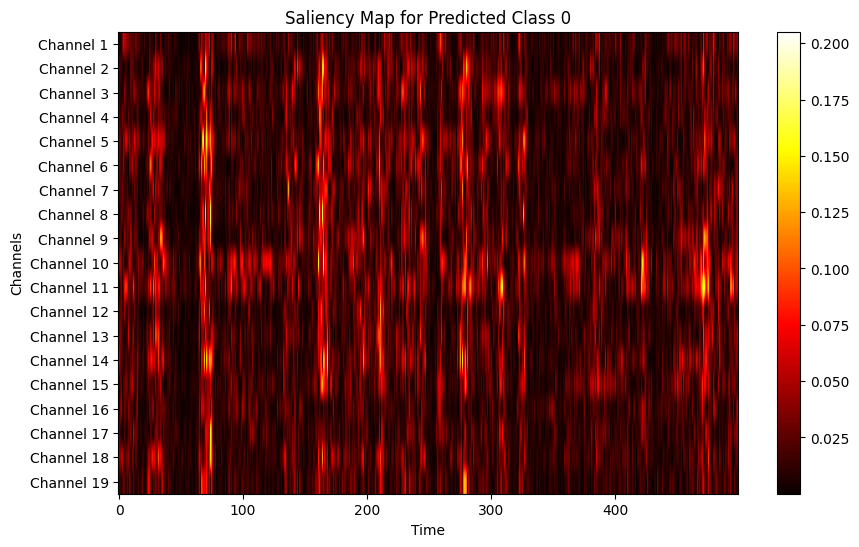

In [131]:
def compute_saliency_map(model, data, target_class, device):
    """
    Compute the saliency map for the given model and data.
    
    Args:
    - model: The CNN model.
    - data: The input EEG data (should be of shape [batch_size, channels, length]).
    - target_class: The class index for which to compute the saliency map.
    - device: The device to run the model on (either 'cpu' or 'cuda').
    
    Returns:
    - saliency_map: The saliency map showing which parts of the input are most influential.
    """
    # Set model to evaluation mode
    model.eval()

    # Ensure the input data has requires_grad set to True
    data.requires_grad_()

    # Move data to the appropriate device
    data = data.to(device)
    
    # Forward pass
    output = model(data)
    
    # Get the score for the target class
    target_score = output[0, target_class]
    
    # Backward pass to get gradients
    model.zero_grad()
    target_score.backward()

    # Get the gradients with respect to the input
    saliency_map = data.grad.abs().squeeze().cpu().detach().numpy()
    
    return saliency_map

def plot_saliency_map(saliency_map, title="Saliency Map", num_channels=19):
    """
    Plot the saliency map, ensuring all EEG channels are shown on the y-axis.
    
    Args:
    - saliency_map: The saliency map to plot.
    - title: The title of the plot.
    - num_channels: The number of EEG channels (default is 19).
    """
    plt.figure(figsize=(10, 6))
    
    # Plot the saliency map with hot color map and aspect ratio adjusted for channels/time
    plt.imshow(saliency_map, cmap='hot', aspect='auto')
    
    # Add color bar
    plt.colorbar()
    
    # Set the title and labels
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Channels")
    
    # Set the y-ticks to correspond to the EEG channels
    plt.yticks(np.arange(num_channels), [f"Channel {i+1}" for i in range(num_channels)])  # Channel labels
    
    plt.show()

# Example Usage
def generate_and_plot_saliency(model, val_loader, device):
    """
    Generate and plot saliency maps for the validation data.

    Args:
    - model: The trained CNN model.
    - val_loader: The validation data loader.
    - device: The device to run the model on (either 'cpu' or 'cuda').
    """
    # Move the model to the appropriate device (GPU or CPU)
    model.to(device)
    
    # Get one batch from the validation loader
    data, labels = next(iter(val_loader))
    data, labels = data.to(device), labels.to(device)
    
    # Take the first sample from the batch
    input_sample = data[0].unsqueeze(0)  # Shape [1, channels, length]

    # Get the predicted class for this sample
    output = model(input_sample)
    predicted_class = output.argmax(dim=1).item()

    # Compute the saliency map for the predicted class
    saliency_map = compute_saliency_map(model, input_sample, predicted_class, device)

    # Plot the saliency map
    plot_saliency_map(saliency_map, title=f"Saliency Map for Predicted Class {predicted_class}")

generate_and_plot_saliency(model, val_loader, device)

In [132]:
# Assuming trained_model is your trained CNN and device is defined
trained_model.eval()
device = torch.device("cpu")
trained_model.to(device)

CNN(
  (conv1): Conv1d(19, 32, kernel_size=(3,), stride=(1,), padding=(1,))
  (conv2): Conv1d(32, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  (pool): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (relu): ReLU()
  (batch_norm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=8000, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=4, bias=True)
)

In [133]:
# Reshape the input data to match the model's expected input
def predict_fn(inputs):
    """
    A wrapper for the trained PyTorch model that outputs probabilities.
    Reshapes the input to match the model's expected input shape.
    """
    batch_size = inputs.shape[0]
    inputs = inputs.reshape(batch_size, 19, 500)  # Reshape to (batch_size, num_channels, seq_length)
    print("Input shape for model (before forward):", inputs.shape)  # Debugging print

    # Convert to torch tensor
    inputs = torch.tensor(inputs, dtype=torch.float32).to(device)

    # Model inference
    with torch.no_grad():
        logits = trained_model(inputs)  # Pass through the model
        print("Logits shape:", logits.shape)  # Debugging print
        probabilities = torch.softmax(logits, dim=1).cpu().numpy()  # Convert to probabilities
        print("Probabilities shape:", probabilities.shape)  # Debugging print

    return probabilities

# Create SHAP Explainer
def create_shap_explainer(model, sample_data):
    """
    Create SHAP Gradient Explainer for the CNN model.
    """
    # Initialize SHAP's Gradient Explainer
    explainer = shap.GradientExplainer(model, sample_data)
    return explainer

# Explaining the model's prediction for a single sample
def explain_sample_with_shap(sample, model, explainer):
    """
    Explain the model's prediction for a single sample using SHAP.
    """
    sample_data = torch.tensor(sample, dtype=torch.float32).to(device)  # Convert to tensor and move to device
    shap_values = explainer.shap_values(sample_data.unsqueeze(0))  # Add batch dimension (unsqueeze)
    return shap_values

# Collect feature importance for each class
importance_by_class = defaultdict(list)


# Sample from each class to ensure balanced explanation
def sample_from_each_class(data, labels, num_per_class=5):
    """
    Ensure at least `num_per_class` samples are included for each class.
    """
    sampled_data, sampled_labels = [], []
    for class_idx in range(4):  
        # Get indices of all samples for the current class
        class_indices = np.where(labels == class_idx)[0]
        
        # Randomly sample `num_per_class` or fewer if not enough samples
        selected_indices = np.random.choice(class_indices, size=min(num_per_class, len(class_indices)), replace=False)
        
        # Add the samples and labels
        sampled_data.append(data[selected_indices])
        sampled_labels.append(labels[selected_indices])
    
    # Concatenate samples from all classes
    return np.concatenate(sampled_data, axis=0), np.concatenate(sampled_labels, axis=0)

Top 3 channels for class 0: ['Channel_15', 'Channel_5', 'Channel_18']
Top 3 channels for class 1: ['Channel_4', 'Channel_15', 'Channel_13']
Top 3 channels for class 2: ['Channel_9', 'Channel_16', 'Channel_2']
Top 3 channels for class 3: ['Channel_11', 'Channel_12', 'Channel_4']


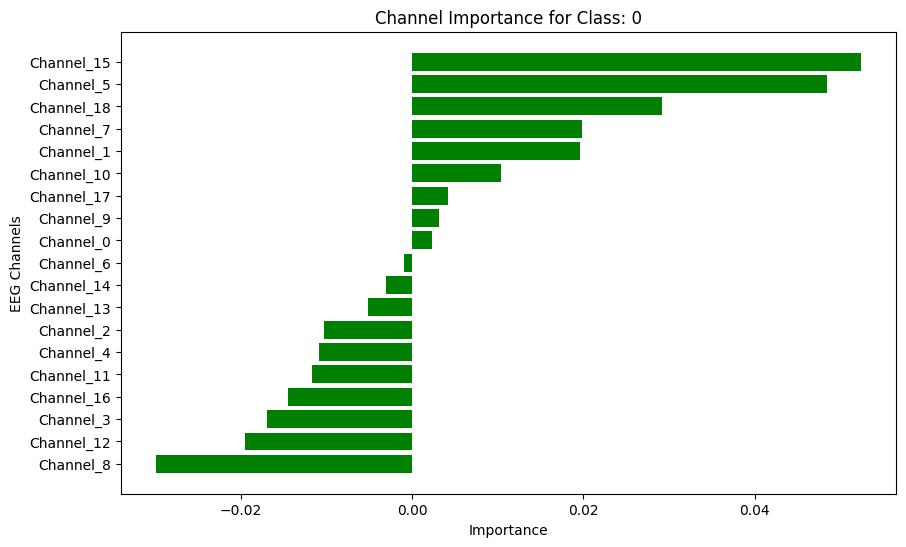

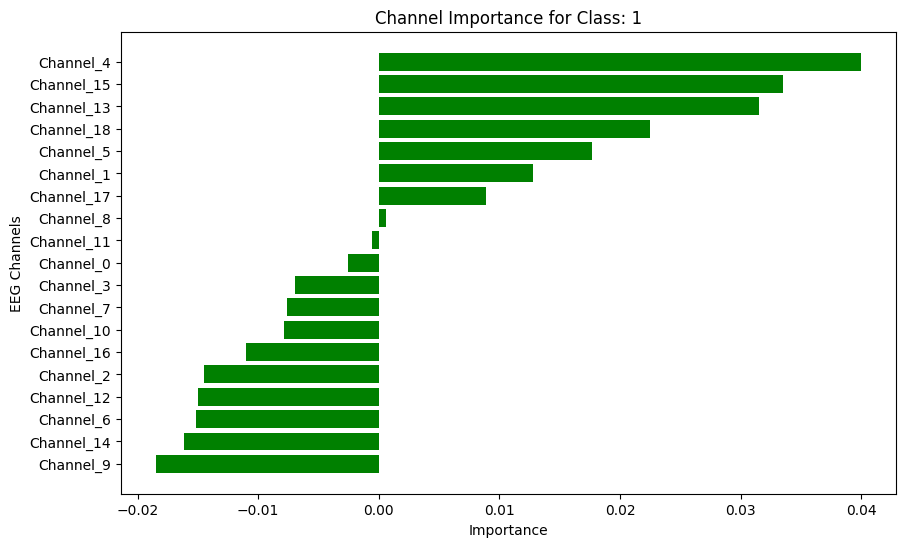

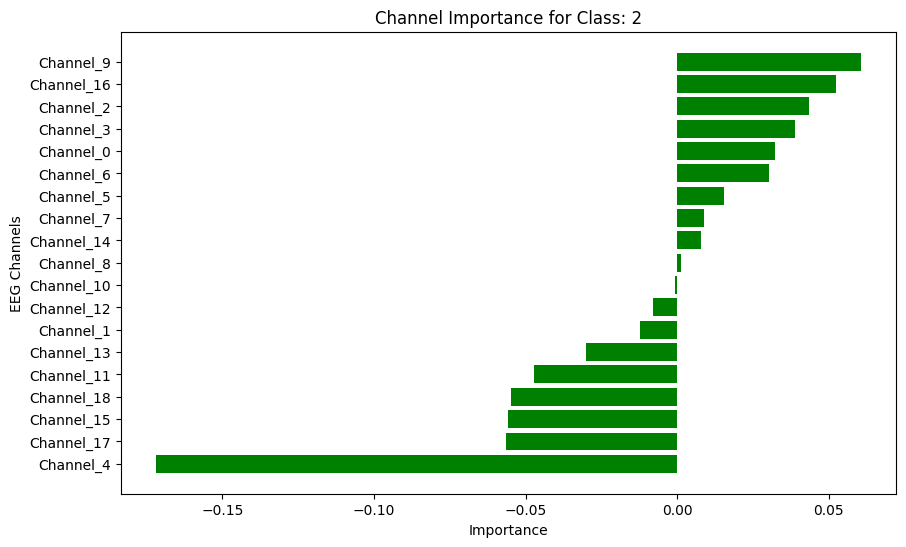

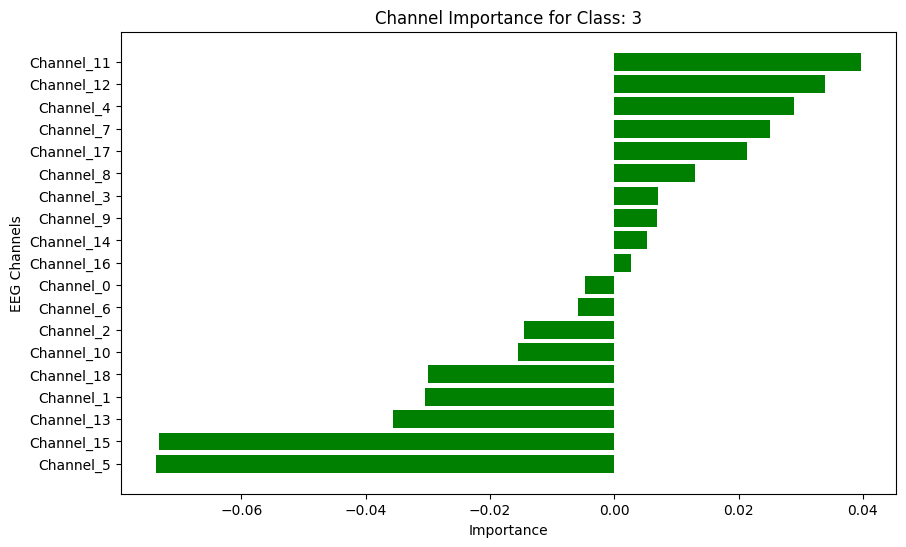

In [134]:
# Sample 1 instance per class (or fewer if not enough samples exist)
sampled_data, sampled_labels = sample_from_each_class(val_data, val_labels, num_per_class=50)

# Initialize SHAP Explainer using a sample
sample_data = torch.tensor(sampled_data, dtype=torch.float32).to(device)
explainer = create_shap_explainer(trained_model, sample_data)

# Generate SHAP explanations for the sampled data
for i in range(len(sampled_data)):
    sample = sampled_data[i]
    label = sampled_labels[i]

    shap_values = explain_sample_with_shap(sample, trained_model, explainer)

    # Iterate over all classes in the explanation
    for class_idx in range(4):  # Assuming 4 classes
        # SHAP values for the top class
        feature_importances = shap_values[class_idx]  # SHAP values for this class
        
        # Iterate over features (channels)
        for channel_idx, importance in enumerate(feature_importances[0]):
            importance_by_class[class_idx].append((channel_idx, importance))

# Aggregate and find top 3 channels for each class
top_channels_by_class = {}
for class_idx, feature_importances in importance_by_class.items():
    # Aggregate importance values for each channel
    aggregated = defaultdict(float)
    for channel, importance in feature_importances:
        # Ensure that the importance value is a scalar
        if isinstance(importance, torch.Tensor):
            importance_value = importance.item()  # Get the scalar value from a tensor
        elif isinstance(importance, np.ndarray):
            importance_value = importance.flatten()[0]  # Flatten and take the first element if it's an array
        else:
            importance_value = importance  # If it's already a scalar, use it directly

        aggregated[channel] += importance_value

    # Sort by importance and select the top 3
    sorted_channels = sorted(aggregated.items(), key=lambda x: x[1], reverse=True)[:3]
    top_channels_by_class[class_idx] = [f"Channel_{ch}" for ch, _ in sorted_channels]

# Print results for top channels per class
for class_idx, top_channels in top_channels_by_class.items():
    print(f"Top 3 channels for class {class_idx}: {top_channels}")


# Optional: Visualize SHAP summary plot for feature importance
for class_idx, feature_importances in importance_by_class.items():
    # Aggregate importance values for each channel
    aggregated = defaultdict(float)
    for channel, importance in feature_importances:
        # Ensure that the importance value is a scalar
        if isinstance(importance, torch.Tensor):
            importance_value = importance.item()  # Get the scalar value from a tensor
        elif isinstance(importance, np.ndarray):
            importance_value = importance.flatten()[0]  # Flatten and take the first element if it's an array
        else:
            importance_value = importance  # If it's already a scalar, use it directly

        aggregated[channel] += importance_value

    # Sort by importance
    sorted_importances = sorted(aggregated.items(), key=lambda x: x[1].item() if isinstance(x[1], torch.Tensor) else x[1], reverse=True)
    channels, importances = zip(*sorted_importances)

    # Plot
    plt.figure(figsize=(10, 6))
    plt.barh([f"Channel_{ch}" for ch in channels], importances, color="green")
    plt.xlabel("Importance")
    plt.ylabel("EEG Channels")
    plt.title(f"Channel Importance for Class: {class_idx}")
    plt.gca().invert_yaxis()
    plt.show()

In [135]:
def plot_temporal_spatial_heatmap(shap_values, num_channels, sequence_length, class_idx, title="SHAP Temporal-Spatial Heatmap"):
    """
    Generates a heatmap for temporal-spatial SHAP values.

    Args:
        shap_values: SHAP values for the input sample (shape: [num_classes, num_channels, sequence_length]).
        num_channels: Number of EEG channels.
        sequence_length: Length of the time series.
        class_idx: Index of the class being visualized.
        title: Title of the heatmap plot.
    """
    # Reshape SHAP values for the specified class
    shap_class_values = shap_values[class_idx].reshape(num_channels, sequence_length)

    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        shap_class_values, 
        cmap="coolwarm", 
        cbar_kws={'label': 'SHAP Value'},
        xticklabels=50,  # Adjust based on sequence length
        yticklabels=[f"Channel_{i}" for i in range(num_channels)]
    )
    plt.title(f"{title} for Class {class_idx}")
    plt.xlabel("Time Steps")
    plt.ylabel("Channels")
    plt.tight_layout()
    plt.show()

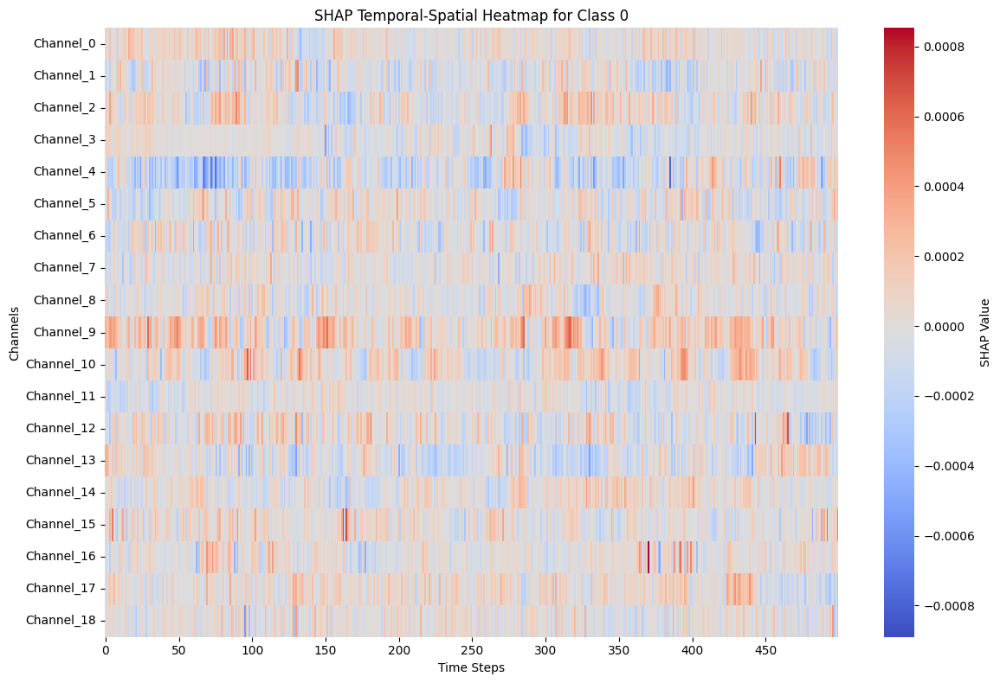

In [ ]:
# Example: shap_values[0] corresponds to the first sample's SHAP values for all classes
sampled_shap_values = []

for i in range(len(sampled_data)):
    sample = sampled_data[i]
    shap_values = explain_sample_with_shap(sample, trained_model, explainer)
    sampled_shap_values.append(shap_values)

# Aggregate SHAP values across samples for each class
shap_aggregated = np.zeros((4, 19, 500))  # Adjust dimensions for (num_classes, num_channels, sequence_length)

for shap_sample_values in sampled_shap_values:
    for class_idx in range(4):  # Assuming 4 classes
        # Remove the extra batch dimension if present
        shap_values_per_class = shap_sample_values[class_idx].squeeze(0)  
        shap_aggregated[class_idx] += shap_values_per_class  # Aggregate per class


# Normalize SHAP values (optional, for visualization purposes)
shap_aggregated /= len(sampled_data)

# Generate heatmaps for each class
for class_idx in range(4):  # Assuming 4 classes
    plot_temporal_spatial_heatmap(
        shap_values=shap_aggregated,
        num_channels=19,
        sequence_length=500,
        class_idx=class_idx,
        title=f"SHAP Temporal-Spatial Heatmap"
    )


## Task 9: Denoising

### Objective
In real-world applications, data from sensors or medical instruments (such as EEG signals) are often noisy due to environmental interference, hardware limitations, and motion artifacts. This noise can degrade the performance of tasks like classification and anomaly detection. The objective of this task is to denoise the EEG data to ensure that the model receives cleaner and more representative signals.

### Methods
1. **Denoising the Data**:
   - You are provided with noisy EEG data in the training folder.
   - Use any denoising method of your choice to clean the data, such as:
     - **Filtering**: Apply low-pass, high-pass, or band-pass filters to remove unwanted frequencies.
     - **Wavelet Denoising**: Use wavelet transforms to isolate and remove noise.
     - **Smoothing**: Use techniques like moving averages or Gaussian smoothing to reduce high-frequency noise.
   
2. **Peak Signal to Noise Ratio (PSNR)**:
   - Calculate the **PSNR** to evaluate the quality of the denoised signal. PSNR measures the difference between the original (clean) signal and the denoised signal.
   - PSNR is calculated as:
     \[
     PSNR = 10 \times \log_{10} \left( \frac{MAX_I^2}{MSE} \right)
     \]
     where \( MAX_I \) is the maximum possible pixel value (for EEG, typically the range of signal values), and MSE is the Mean Squared Error between the ground truth (original) and the denoised signal.

3. **Training the Classifier**:
   - Train your classifier using the denoised data and evaluate its performance on the validation set.
   - Present the classification report from scikit-learn, including metrics like precision, recall, and F1-score.

### Deliverables
1. **Denoised Data**: The cleaned version of the provided noisy training data.
2. **PSNR Report**: The PSNR value in dB comparing the denoised signal with the ground truth.
3. **Model Evaluation**: A classification report showing the model's performance on the validation set after training with the denoised data.


In [ ]:
def calculate_psnr(original_signal, processed_signal):
    """
    Calculate the Peak Signal-to-Noise Ratio (PSNR) between two signals.
    
    Parameters:
        original_signal (numpy.ndarray): The original signal.
        processed_signal (numpy.ndarray): The processed/reconstructed signal.
    
    Returns:
        float: PSNR value in decibels (dB).
    """
    # Ensure inputs are numpy arrays
    original_signal = np.asarray(original_signal)
    processed_signal = np.asarray(processed_signal)
    
    # Mean Squared Error (MSE)
    mse = np.mean((original_signal - processed_signal) ** 2)
    if mse == 0:
        return float('inf')  # Signals are identical
    
    # Maximum possible value of the signal
    max_val = np.max(original_signal)
    
    # Calculate PSNR
    psnr = 20 * np.log10(max_val) - 10 * np.log10(mse)
    return psnr

In [ ]:
# Example usage:
normaleg,_ = normaldataset[9]
normal_data = np.array(normaleg)
noiseg,_ = normalnoisedataset[9]
noise_data = np.array(noiseg)

# Create a sample signal
plt.figure(figsize=(12, 10))
signalog = normal_data[7]
t = np.linspace(0, 16, 63)
print(len(t))
t_new = np.linspace(0,1,500)

plt.subplot(6, 1, 6)
plt.plot(signalog)
plt.title("og Signal")

mean = 0  # Mean of the noise
std_dev = 0.01  # Standard deviation of the noise
noise = np.random.normal(mean, std_dev, size=signalog.shape)

# Noisy signal
signal = noise_data[7]

# Perform 4-level DWT on the signal
wavelet = 'db1'  # Haar wavelet
coeffs = dwt_4_level(signal, wavelet)

# Plot the original signal and the coefficients at each level


plt.subplot(6, 1, 1)
plt.plot(signal)
plt.title("noisey Signal")

# Plot the approximation and detail coefficients for each level
for i, (approx, detail) in enumerate(coeffs[0]):
    plt.subplot(6, 1, i+2)
    
    approx = resample(approx, 500)
    detail = resample(detail, 500)
    psnr_value = calculate_psnr(signal, approx)
    print(f"PSNR: {psnr_value:.2f} dB")
    plt.plot(approx, label=f"Level {i+1} Approximation")
    plt.plot(detail, label=f"Level {i+1} Detail", linestyle='--')
    plt.plot(approx+detail, label=f"Level {i+1} signal")
    plt.title(f"Level {i+1} Coefficients")
    plt.legend()

plt.tight_layout()
plt.show()

## Task 10: Generative Modeling Techniques for Synthetic EEG Data

### Objective
Generative algorithms have enabled the creation of realistic synthetic data that mimics the statistical properties of real data. In this task, you will use generative models to create class-wise synthetic EEG data. This synthetic data can be used to augment the training dataset, improving the performance of models for downstream tasks such as classification. In fields like healthcare, where annotated data is scarce and expensive, generative modeling becomes a key solution for overcoming data limitations.

### Methods
1. **Generating Synthetic EEG Data**:
   - Use generative models to create synthetic EEG data for each class (Normal, Complex Partial Seizures, Electrographic Seizures, and Video Detected Seizures).
   - The synthetic data should replicate the distribution and characteristics of real EEG data as closely as possible.
   - You are free to use any generative algorithms of your choice, such as:
     - **GANs (Generative Adversarial Networks)**: A popular choice for generating realistic synthetic data.
     - **Variational Autoencoders (VAEs)**: Another approach for generating synthetic data by learning the underlying distribution of the real data.
     - **Other Generative Models**: You can explore other models depending on your preference or experiment with a hybrid approach.

2. **Training the Classifier**:
   - Use the generated synthetic EEG data to train a classifier.
   - Evaluate the performance of the classifier on the validation set.
   - The evaluation will be based on how well the classifier trained with synthetic data performs compared to the classifier trained with real data.

3. **Evaluating the Quality of Synthetic Data**:
   - Suggest metrics to evaluate the quality of the generated synthetic EEG data. These metrics may include:
     - **Frechet Inception Distance (FID)**: Measures the distance between distributions of real and generated data.
     - **Kullback-Leibler (KL) Divergence**: Quantifies how one probability distribution diverges from a second, reference probability distribution.
     - **Visual Similarity**: Visual inspection using tools like t-SNE to check if the generated data visually matches the real data.

### Deliverables
1. **Synthetic EEG Data**: A class-wise synthetic EEG dataset generated using the chosen generative model.
2. **Classifier Performance**: A report comparing the performance of the classifier trained with synthetic data to one trained with real data.
3. **Evaluation Metrics**: Suggested metrics for evaluating the quality of the generated synthetic EEG data.


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
train_path = "/kaggle/input/impulse/Impulse/EEG_Data/train_data"
latent_dim = 100  # Size of the latent space
input_dim = 19 * 500  # Flattened size of each EEG sample
num_classes = 4  # Number of classes
batch_size = 128  # Batch size for training
epochs = 1000  # Number of epochs
learning_rate = 0.0001  # Learning rate
beta = 0.1   # Weight for KL divergence in the loss

In [ ]:
train_data = []
train_labels = []

for class_name, class_label in class_map.items():
    class_folder = os.path.join(train_path, class_name)
    for file_name in os.listdir(class_folder):
        file_path = os.path.join(class_folder, file_name)
        signal = np.load(file_path)  # Assuming .npy files
        if signal.shape == (19, 500):  # Ensure correct shape
            normalized_signal = normalize_data(signal)
            train_data.append(normalized_signal.flatten())  # Flatten to (19 * 500,)
            train_labels.append(class_label)

In [ ]:
# Convert to tensors
train_data = torch.tensor(np.array(train_data), dtype=torch.float32)
train_labels = torch.tensor(train_labels, dtype=torch.long)

In [ ]:
class EEGDataset(Dataset):
    def __init__(self, data, labels):
        self.data = data
        self.labels = labels

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]


In [ ]:
dataset = EEGDataset(train_data, train_labels)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)


In [ ]:
class Generator(nn.Module):
    def __init__(self, z_dim, num_classes, input_dim):
        super(Generator, self).__init__()

        self.class_emb = nn.Sequential(
            nn.Linear(num_classes, 16),
            nn.LeakyReLU(0.2, inplace=True)
        )

        input_dim = z_dim + 16
        self.net = nn.Sequential(
        nn.Linear(input_dim, 256),
        nn.BatchNorm1d(256),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Linear(256, 512),
        nn.BatchNorm1d(512),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Linear(512, 19 * 500),
        nn.Tanh()
        )

    def forward(self, z, labels):
        class_emb = self.class_emb(labels)
        x = torch.cat([z, class_emb], dim=1)
        out = self.net(x)
        return out

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, num_classes, input_dim):
        super(Discriminator, self).__init__()

        self.class_emb = nn.Sequential(
            nn.Linear(num_classes, 16),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Corrected input_dim calculation
        input_dim = 19 * 500 + 16  # EEG flattened size + class embedding size
        self.net = nn.Sequential(
        nn.Linear(input_dim, 512),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Dropout(0.3),
        nn.Linear(512, 256),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Dropout(0.3),
        nn.Linear(256, 1),
        nn.Sigmoid()
        )


    def forward(self, x, labels):
        # x: (batch_size, 19 * 500)
        class_emb = self.class_emb(labels)  # (batch_size, 16)
        combined = torch.cat([x, class_emb], dim=1)  # Concatenate along feature dimension
        validity = self.net(combined)
        return validity

In [ ]:
criterion = nn.BCELoss()

In [ ]:
# Instantiate models



# Instantiate the models
generator = Generator(latent_dim, num_classes, output_shape).to(device)
discriminator = Discriminator(num_classes, input_dim).to(device)

generator = Generator(latent_dim, num_classes, input_dim).to(device)
discriminator = Discriminator(num_classes, input_dim).to(device)

# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=learning_rate*5, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.999))


In [ ]:
# Early stopping parameters
patience = 10  # Number of epochs to wait for improvement
best_g_loss = float('inf')
no_improve_epochs = 0

# Gradient clipping value
grad_clip_value = 5.0

# Initialize lists to store losses and accuracy
d_losses, g_losses = [], []
d_accuracies = []

for epoch in range(epochs):
    epoch_d_loss = 0
    epoch_g_loss = 0
    correct_real = 0
    correct_fake = 0
    total_samples = 0

    for real_eeg, real_labels in dataloader:
        real_eeg = real_eeg.to(device)
        real_labels = F.one_hot(real_labels, num_classes=num_classes).float().to(device)
        batch_size = real_eeg.size(0)
        total_samples += batch_size

        # ---------------------
        #  Train Discriminator
        # ---------------------
        optimizer_D.zero_grad()

        # Real EEG
        real_targets = torch.ones(batch_size, 1).to(device)
        pred_real = discriminator(real_eeg, real_labels)
        loss_real = criterion(pred_real, real_targets)

        # Track discriminator accuracy for real samples
        correct_real += (pred_real > 0.5).sum().item()

        # Fake EEG
        z = torch.randn(batch_size, latent_dim).to(device)
        fake_labels = real_labels
        fake_eeg = generator(z, fake_labels)
        fake_targets = torch.zeros(batch_size, 1).to(device)
        pred_fake = discriminator(fake_eeg.detach(), fake_labels)
        loss_fake = criterion(pred_fake, fake_targets)

        # Track discriminator accuracy for fake samples
        correct_fake += (pred_fake < 0.5).sum().item()

        # Combine losses
        d_loss = loss_real + loss_fake
        d_loss.backward()

        # Gradient clipping for discriminator
        torch.nn.utils.clip_grad_norm_(discriminator.parameters(), grad_clip_value)

        optimizer_D.step()

        # -----------------
        #  Train Generator
        # -----------------
        optimizer_G.zero_grad()

        pred_fake_for_g = discriminator(fake_eeg, fake_labels)
        g_loss = criterion(pred_fake_for_g, real_targets)  # Flip target labels for generator training
        g_loss.backward()

        # Gradient clipping for generator
        torch.nn.utils.clip_grad_norm_(generator.parameters(), grad_clip_value)

        optimizer_G.step()

        # Update epoch loss
        epoch_d_loss += d_loss.item()
        epoch_g_loss += g_loss.item()

    # Calculate average losses and accuracy
    avg_d_loss = epoch_d_loss / len(dataloader)
    avg_g_loss = epoch_g_loss / len(dataloader)
    d_accuracy = (correct_real + correct_fake) / (2 * total_samples)

    d_losses.append(avg_d_loss)
    g_losses.append(avg_g_loss)
    d_accuracies.append(d_accuracy)

    print(f"Epoch [{epoch + 1}/{epochs}] | D Loss: {avg_d_loss:.4f} | G Loss: {avg_g_loss:.4f} | D Accuracy: {d_accuracy:.4f}")

    # Early stopping logic
    if avg_g_loss < best_g_loss:
        best_g_loss = avg_g_loss
        no_improve_epochs = 0

        # Save the best generator
        torch.save(generator.state_dict(), "best_generator.pth")
        print("  * Best Generator Saved!")
    else:
        no_improve_epochs += 1
        print(f"  * No improvement for {no_improve_epochs} epochs.")

    if no_improve_epochs >= patience:
        print("Early stopping triggered.")
        break

# Final results
print("Training complete.")
print(f"Best Generator Loss: {best_g_loss:.4f}")

In [ ]:
import os
import numpy as np
import torch

# Assuming generator, latent_dim, num_classes, and device are already defined
output_dir = "./output"
os.makedirs(output_dir, exist_ok=True)

# Calculate class distribution in training data
class_counts = np.bincount(train_labels.numpy())
total_samples = len(train_labels)
class_ratios = class_counts / total_samples

# Set the total number of synthetic samples to generate
total_synthetic_samples = 5608  # Adjust as needed
synthetic_samples_per_class = (class_ratios * total_synthetic_samples).astype(int)

# Generate synthetic EEG data while maintaining class ratio
generator.eval()
for class_idx, num_samples in enumerate(synthetic_samples_per_class):
    if num_samples == 0:  # Skip classes with no samples
        continue

    z = torch.randn(num_samples, latent_dim).to(device)
    class_label = torch.zeros(num_samples, num_classes).to(device)
    class_label[:, class_idx] = 1  # One-hot encode the class label

    with torch.no_grad():
        synthetic_eeg = generator(z, class_label)

        # Save synthetic EEG data class-wise
        output_file = os.path.join(output_dir, f"synthetic_eeg_{class_idx}.npy")
        np.save(output_file, synthetic_eeg.cpu().numpy())
        print(f"Saved synthetic EEG data for class {class_idx} to {output_file}")